## Setup

In [1]:
import anndata
import numpy as np
import pandas as p
import seaborn as sns
from scipy import stats
import liana as li
import scanpy as sc
import cell2cell as c2c
import decoupler as dc # needed for pathway analysis
from collections import defaultdict
import pickle
import torch
import io
import plotnine as p9
import decoupler as dc # needed for pathway analysis
#from statannotations.Annotator import Annotator
from liana.method import singlecellsignalr, connectome, cellphonedb, natmi, logfc, cellchat, geometric_mean
import os
import omnipath as op
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from io import BytesIO
import PIL.Image


/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 80, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.9.2
scanpy      1.9.6
-----
PIL                 10.4.0
asttokens           NA
attr                23.2.0
backcall            0.2.0
brotli              1.1.0
cell2cell           0.7.4
certifi             2024.06.02
cffi                1.16.0
charset_normalizer  3.3.2
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.2
decorator           5.1.1
decoupler           1.6.0
docrep              0.3.2
executing           2.0.1
get_annotations     NA
h5py                3.11.0
idna                3.7
importlib_resources NA
inflect             NA
ipykernel           6.29.5
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
kneed               0.8.5
liana               1.2.1
llvmlite            0.41.1
matplotlib          3.7.5
mizani              0.9.3
more_itertools      10.3.0
mpl_toolkits        NA
mudata              0.2.3
natsort             8.4.0
networkx        

In [3]:

def unpickle_gpu_tensor(filepath: str, processing_unit: str):
    '''
    Function to load a pickled tensor file created using cell2cell with gpu acceleration

    filepath: str = path of the tensor file
    processing_unit: str = processing_unit used in the current environment to load the file onto (either "gpu" or "cpu")
    '''
    class CPU_Unpickler(pickle.Unpickler):
        def find_class(self, module, name):
            if module == 'torch.storage' and name == '_load_from_bytes':
                return lambda b: torch.load(io.BytesIO(b), map_location='cpu')
            else: return super().find_class(module, name)

    processing_unit_values = ['cpu', 'gpu']
    if processing_unit == 'cpu':
        with open(filepath, 'rb') as f:
            tensor = CPU_Unpickler(f).load()
    elif processing_unit == 'gpu':
        with open(filepath, 'rb') as f:
            tensor = pickle.load(f)
    else:
        raise ValueError(f'accelerator must be one of {processing_unit_values}')
    return tensor

# Function to save a plot to a BytesIO object
def save_plot_to_buffer(plot_func, *args, **kwargs):
    buf = BytesIO()
    plot_func(*args, **kwargs)
    plt.savefig(buf, format='png')
    buf.seek(0)
    plt.close()
    return buf

In [4]:
data_dir = os.path.join(os.getcwd(), '.data')
os.makedirs(data_dir, exist_ok=True)
os.listdir(data_dir)

['Marburg_cell_states_locked_ctl240504.raw.h5ad',
 'final_tensor_compartment_COPD.pkl',
 'final_tensor_group.pkl',
 'Marburg_cell_states_locked_ctl240709.raw.h5ad',
 'final_tensor_compartment_healthy.pkl',
 'final_tensor.pkl']

In [5]:
adata_path = os.path.join(data_dir, 'Marburg_cell_states_locked_ctl240709.raw.h5ad')
adata_all = sc.read_h5ad(adata_path)
adata_all

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    uns: 'cell_compartment_colors', 'cell_states_colors', 'disease_colors', 'group_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_umap'

In [6]:
sample_key = 'batch'
condition_key = 'infection'
groupby = 'cell_compartment'

In [7]:
context_dict = adata_all.obs[[sample_key, condition_key]].drop_duplicates()
context_dict = dict(zip(context_dict[sample_key], context_dict[condition_key]))
context_dict = defaultdict(lambda: 'Unknown', context_dict)
# Generate color by severity for each sample
condition_colors = c2c.plotting.aesthetics.get_colors_from_labels(['CTRL', 'IAV'], cmap='plasma')

# Map these colors to each sample name
color_dict = {k : condition_colors[v] for k, v in context_dict.items()}

col_colors = pd.Series(color_dict)
col_colors = col_colors.to_frame()
col_colors.columns = ['infection status']
context_dict

defaultdict(<function __main__.<lambda>()>,
            {'ST07_CSE_CTRL': 'CTRL',
             'CSE_06_CRTL': 'CTRL',
             'GER14_CRTL': 'CTRL',
             'GnR08_CTRL': 'CTRL',
             'GER12_CTRL': 'CTRL',
             'GER02_CTRL': 'CTRL',
             'ST10_GnR_IAV': 'IAV',
             'GnR_07_IAV': 'IAV',
             'CHE01_IAV': 'IAV',
             'CHE02_IAV': 'IAV',
             'CHE03_IAV': 'IAV',
             'CSE03_IAV': 'IAV',
             'ST09_CSE_IAV': 'IAV',
             'GnR_07_CTRL': 'CTRL',
             'CHE01_CTRL': 'CTRL',
             'CHE02_CTRL': 'CTRL',
             'CHE03_CTRL': 'CTRL',
             'CSE03_CTRL': 'CTRL',
             'ST08_GnR_CTRL': 'CTRL',
             'CSE_06_IAV': 'IAV',
             'GER14_IAV': 'IAV',
             'GnR08_IAV': 'IAV',
             'GER12_IAV': 'IAV',
             'GER02_IAV': 'IAV'})

In [8]:
# load PROGENy pathways
net = dc.get_progeny(organism='human', top=5000)
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')

## Analysis

### Healthy

In [9]:
# Path
file_name = 'final_tensor_compartment_healthy.pkl'
file_path = os.path.join(data_dir, file_name)
# Load
tensor_healthy = unpickle_gpu_tensor(file_path, 'cpu')
tensor_healthy

In [10]:
factors_healthy = tensor_healthy.factors
factors_healthy.keys()

odict_keys(['Contexts', 'Ligand-Receptor Pairs', 'Sender Cells', 'Receiver Cells'])

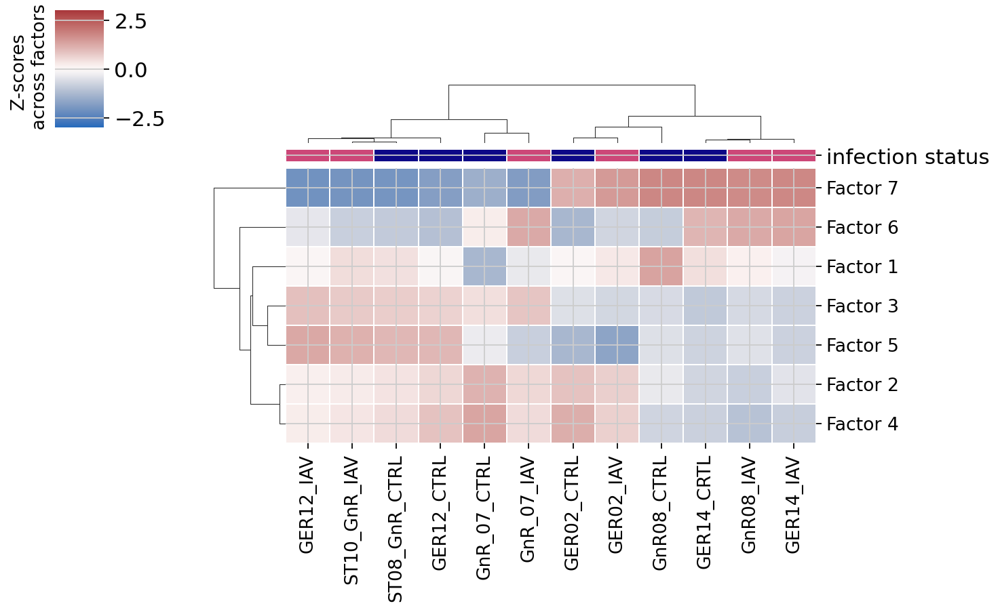

In [11]:
c2c.plotting.loading_clustermap(factors_healthy['Contexts'],
                                use_zscore=True, # Whether standardizing the loadings across factors
                                col_colors=col_colors, # Change this to color by other properties
                                figsize=(9, 6),
                                dendrogram_ratio=0.3,
                                cbar_fontsize=12,
                                tick_fontsize=12
                                )

(<Figure size 640x960 with 8 Axes>,
 array([[<Axes: title={'center': 'Factor 1'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 2'}, ylabel=' '>],
        [<Axes: title={'center': 'Factor 3'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 4'}, ylabel=' '>],
        [<Axes: title={'center': 'Factor 5'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 6'}, ylabel=' '>],
        [<Axes: title={'center': 'Factor 7'}, ylabel='Context Loadings'>,
         <Axes: >]], dtype=object))

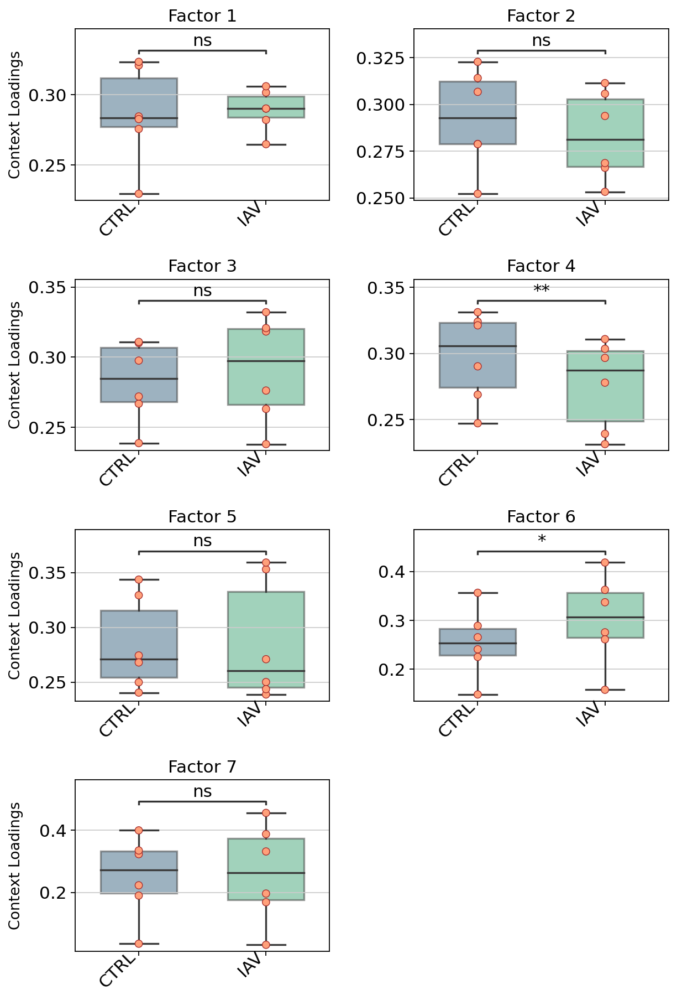

In [12]:
c2c.plotting.factor_plot.context_boxplot(factors_healthy['Contexts'],
                            metadict=context_dict,
                            group_label_rotation= 45,
                            nrows=4,
                            figsize=(8, 12),
                            group_order=['CTRL', 'IAV'],
                            statistical_test='t-test_paired',
                            pval_correction='BH',
                            verbose=False,
                            cmap='viridis',
                            ylabel="Context Loadings",
                            text_format='star'
                            )

(<Figure size 1920x1920 with 9 Axes>,
 array([[<Axes: title={'center': 'Factor 1'}>,
         <Axes: title={'center': 'Factor 2'}>,
         <Axes: title={'center': 'Factor 3'}>],
        [<Axes: title={'center': 'Factor 4'}>,
         <Axes: title={'center': 'Factor 5'}>,
         <Axes: title={'center': 'Factor 6'}>],
        [<Axes: title={'center': 'Factor 7'}>, <Axes: >, <Axes: >]],
       dtype=object))

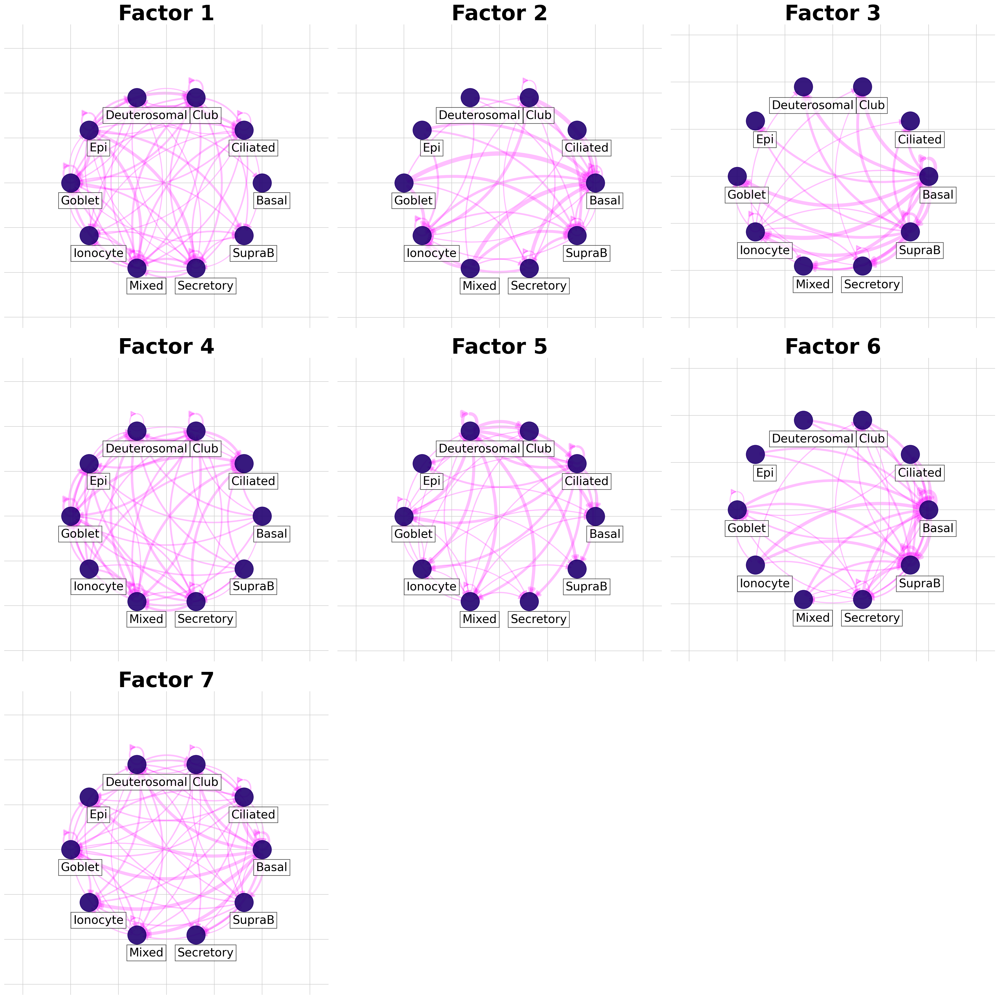

In [13]:
c2c.plotting.ccc_networks_plot(factors_healthy,
                               included_factors=['Factor 1','Factor 2', 'Factor 3','Factor 4','Factor 5', 'Factor 6', 'Factor 7'],
                               network_layout='circular',
                               ccc_threshold=0.07, # Only important communication
                               nrows=3,
                               panel_size=(8, 8), # This changes the size of each figure panel.
                              )

GSEA enrichment

In [73]:
lr_loadings_healthy = factors_healthy['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
output_folder = data_dir


In [121]:
# Generate list with ligand-receptors pairs in DB
lr_list_H = ['^'.join(row) for idx, row in lr_pairs.iterrows()]
# Specify the organism and pathway database to use for building the LR set
organism = "human"
pathwaydb = "Reactome"
# Generate ligand-receptor gene sets
lr_set_H = c2c.external.generate_lr_geneset(lr_list_H,
complex_sep='_',
lr_sep='^',
organism=organism,
pathwaydb=pathwaydb,
readable_name=True
)

In [122]:
pvals_H, scores_H, gsea_df_H = c2c.external.run_gsea(loadings=lr_loadings_healthy,
lr_set=lr_set_H,
output_folder=output_folder+'/GSEA_healthy',
weight=1,
min_size=15,
permutations=999,
processes=6,
random_state=6,
significance_threshold=0.05,
)

/home/camila93/Documents/COPD_influenza/6-cell-cell_comms/4-tensor/.data/GSEA_healthy already exists.


  0%|          | 0/7 [00:00<?, ?it/s]2024-08-12 17:38:21,146 [WARNING] Duplicated values found in preranked stats: 2.11% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 32 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't']
Glyph IDs:   [0, 1, 2, 3, 36, 38, 39, 40, 42, 44, 47, 49, 50, 51, 53, 54, 55, 56, 68, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 85, 86, 87]
Closed glyph list over 'GSUB': 32 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 

/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first

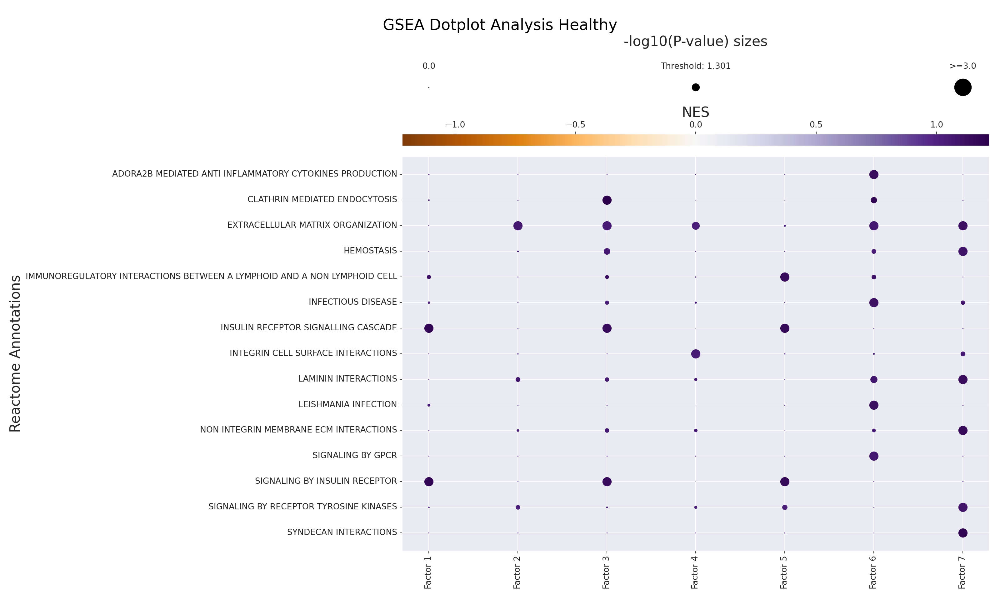

In [124]:
pathway_label = '{} Annotations'.format(pathwaydb)
fig_filename = output_folder + '/GSEA-healthy-Dotplot.pdf'
with sns.axes_style("darkgrid"):
    dotplot = c2c.plotting.pval_plot.generate_dot_plot(pval_df=pvals_H,
    score_df=scores_H,
    significance=0.05,
    xlabel='',
    ylabel=pathway_label,
    cbar_title='NES',
    cmap='PuOr',
    figsize=(20, 12),
    label_size=20,
    title_size=20,
    tick_size=12,
    filename=fig_filename
    )

plt.suptitle("GSEA Dotplot Analysis Healthy", fontsize=22, y=0.97) 
plt.tight_layout()


Footprint enrichment with PROGENy

In [14]:
lr_loadings_healthy = factors_healthy['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')
# generate ligand-receptor geneset
lr_progeny = li.rs.generate_lr_geneset(lr_pairs, net, lr_sep="^")
# run enrichment analysis
estimate_healthy, pvals_healthy = dc.run_ulm(lr_loadings_healthy.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

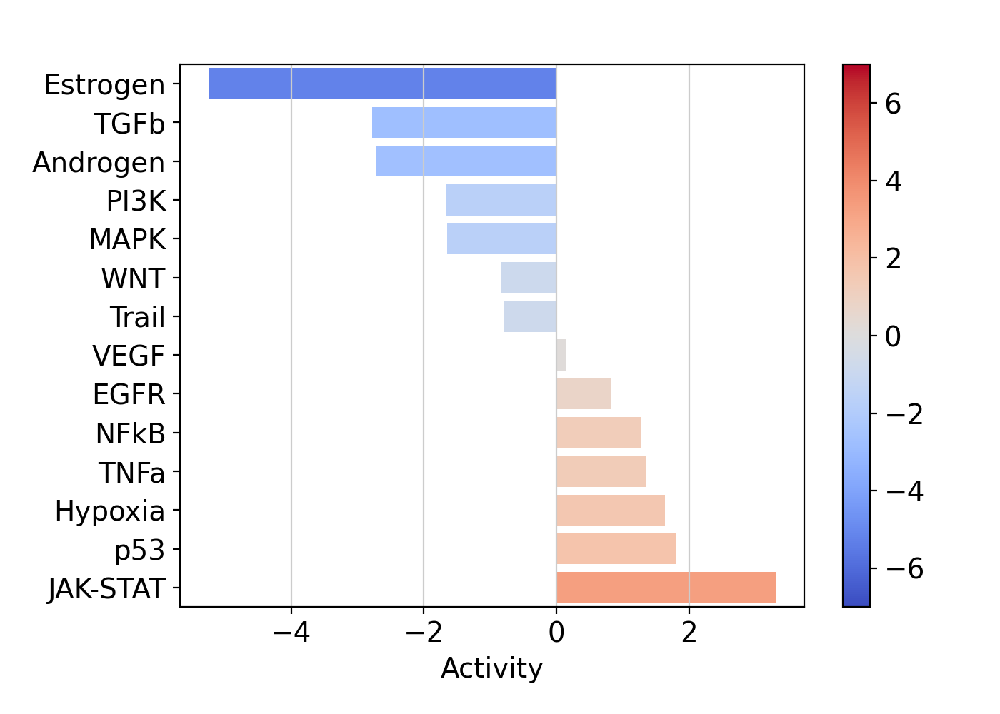

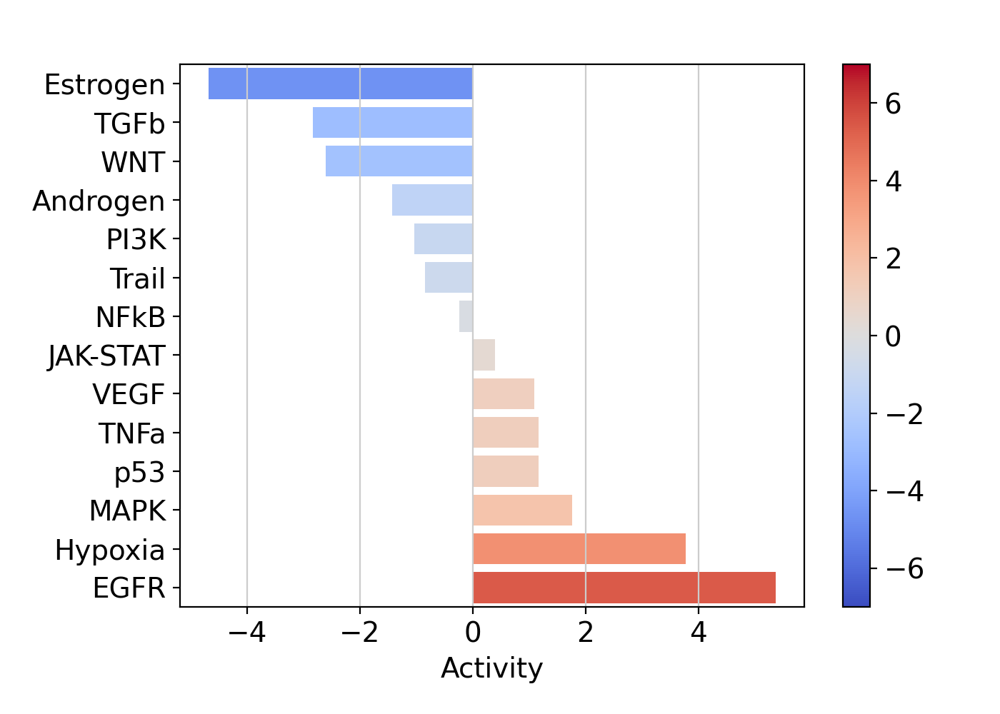

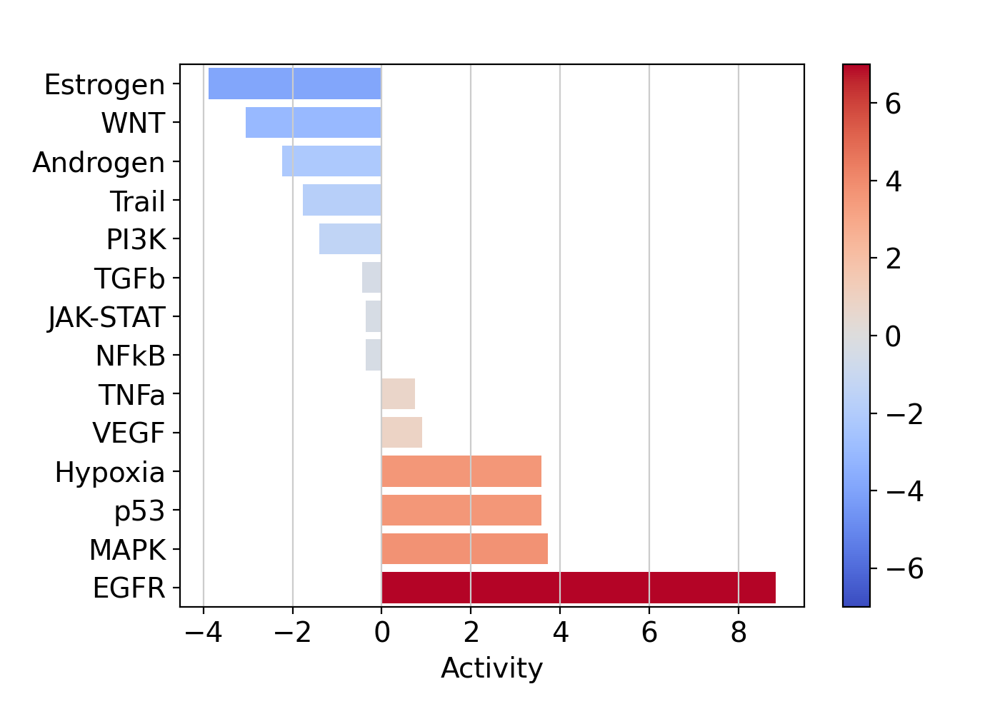

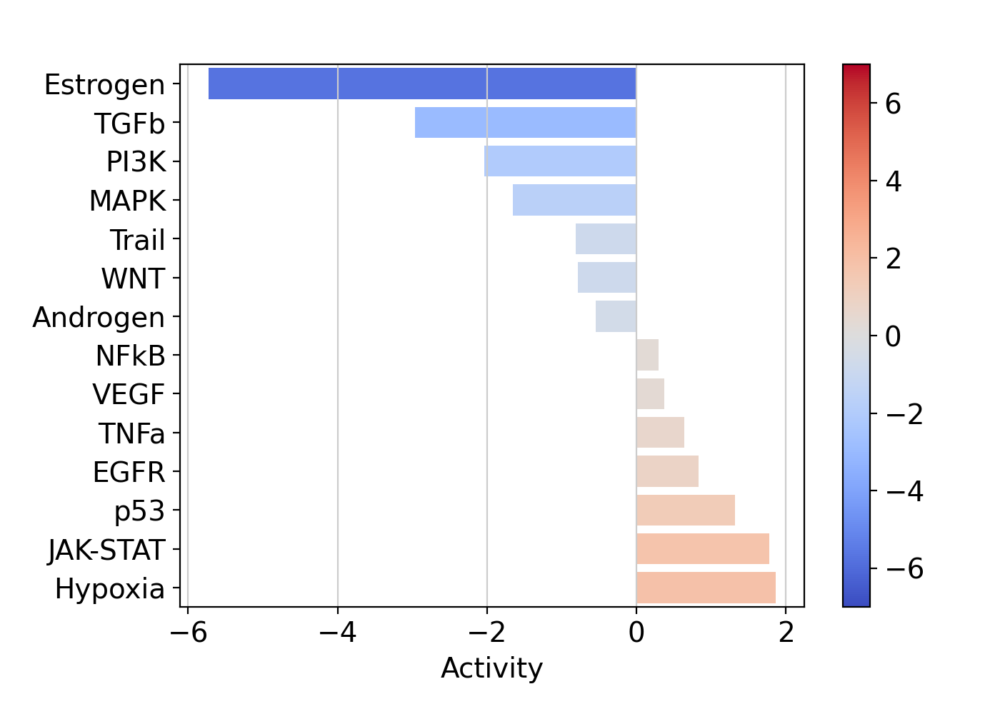

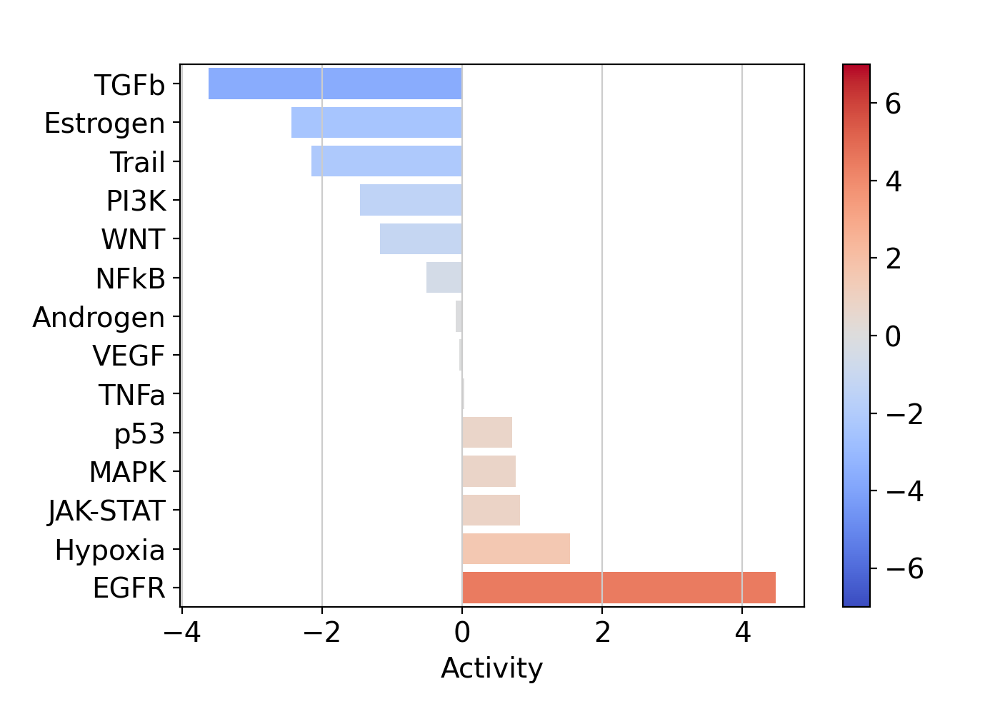

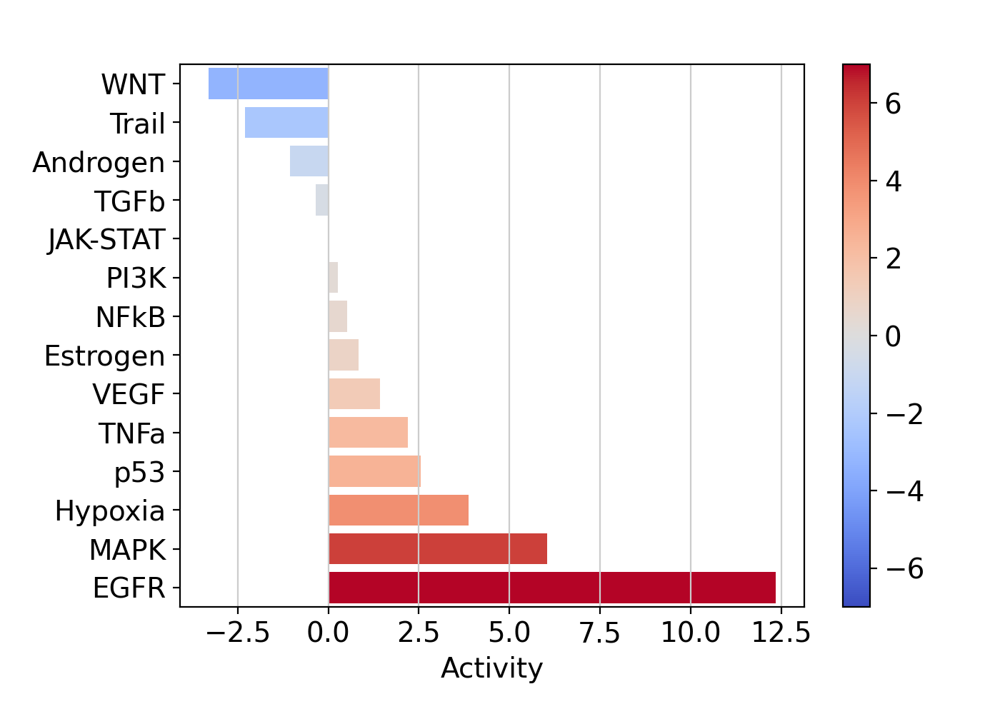

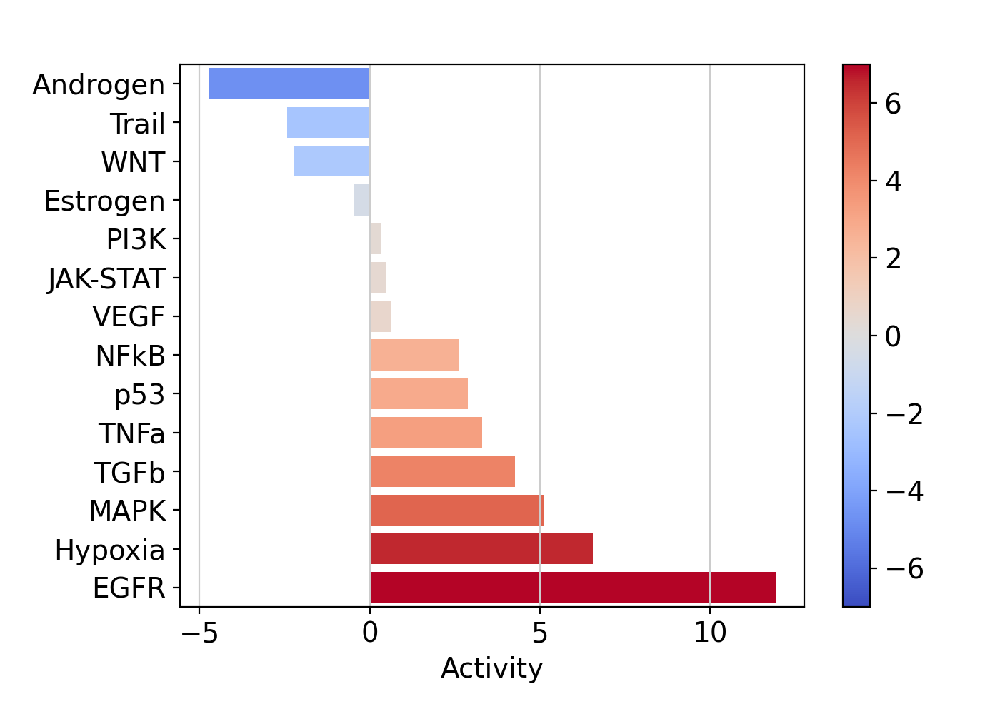

In [40]:
dc.plot_barplot(estimate_healthy, 'Factor 1', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_healthy, 'Factor 2', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_healthy, 'Factor 3', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_healthy, 'Factor 4', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_healthy, 'Factor 5', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_healthy, 'Factor 6', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_healthy, 'Factor 7', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)

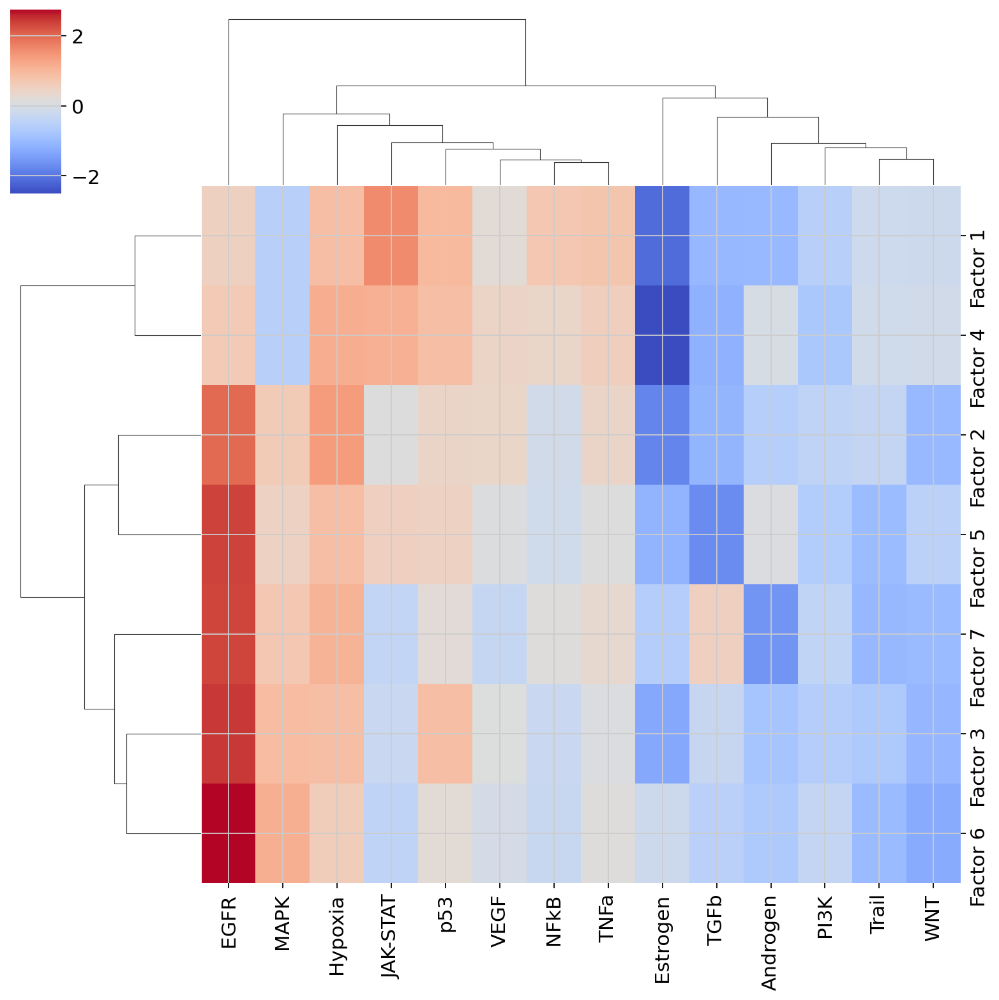

In [16]:
sns.clustermap(estimate_healthy, xticklabels=estimate_healthy.columns, cmap='coolwarm', z_score=4)

/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 15 rows containing missing values.
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_label : Removed 70 rows containing missing values.


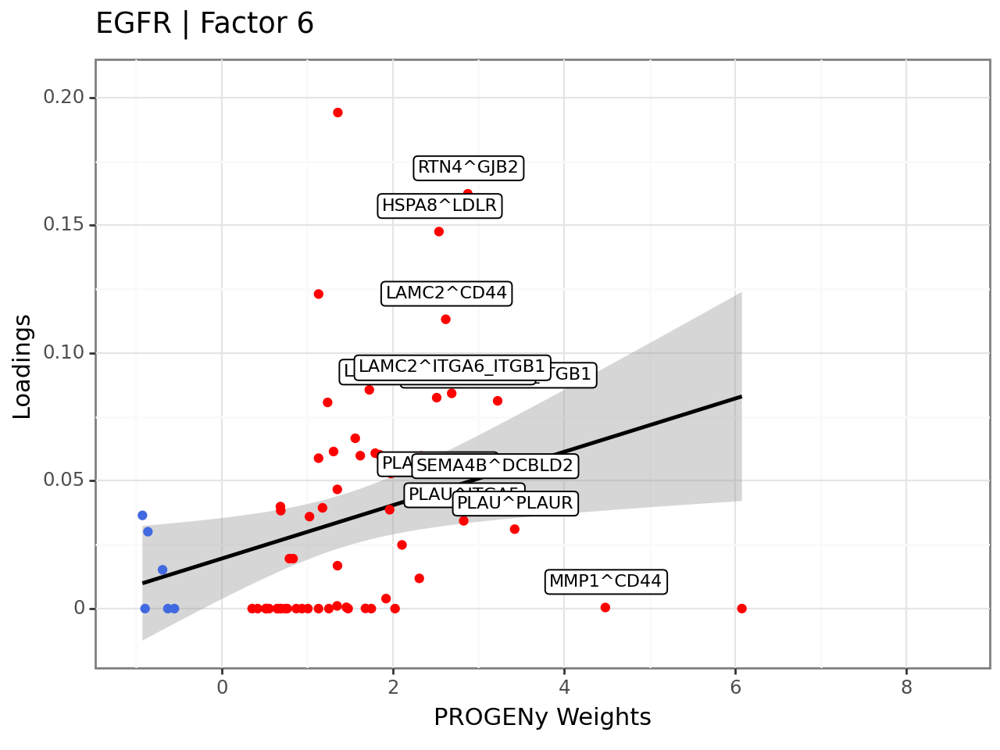

<Figure Size: (640 x 480)>

In [17]:
#select factor of interest
selected_factor = 'Factor 6'
#select pathway of interest
pathway = 'EGFR'
# loadings to long format
lr_loadings_long = lr_loadings_healthy.reset_index().melt(id_vars='index', var_name="Factor", value_name="Loadings").rename(columns={'index':'interaction'})
# join progeny weights and keep only NFkB pathway
lr_loadings_long = lr_loadings_long.merge(lr_progeny, on='interaction').query("source == '{}' and Factor == '{}'".format(pathway, selected_factor))
# add sign to the weights
lr_loadings_long['sign'] = lr_loadings_long['weight'].apply(lambda x: 'positive' if x > 0 else 'negative')
# keep only relevant interactions for labels
lr_loadings_long['relevant_interactions'] = lr_loadings_long.apply(lambda x: x['interaction'] if (x['Loadings'] > 0.00025) and (x['weight'] > 2.5) else None, axis=1)

(p9.ggplot(lr_loadings_long,
           p9.aes(x='weight', y='Loadings')) +
 p9.geom_smooth(method='lm') +
 p9.geom_point(p9.aes(colour='sign')) +
 p9.theme_bw() +
 p9.theme(legend_position='none') +
 p9.labs(title="{} | {}".format(pathway, selected_factor), x="PROGENy Weights", y="Loadings") +
 p9.scale_colour_manual(values=["royalblue", "red"]) +
 p9.geom_label(p9.aes(label='relevant_interactions'), size=8, nudge_y=0.01, nudge_x=0.01) +
 p9.xlim(-1, 8.5)
 )

### COPD

In [18]:
# Path
file_name = 'final_tensor_compartment_COPD.pkl'
file_path = os.path.join(data_dir, file_name)
# Load
tensor_COPD = unpickle_gpu_tensor(file_path, 'cpu')
tensor_COPD

In [19]:
factors_COPD = tensor_COPD.factors
factors_COPD.keys()

odict_keys(['Contexts', 'Ligand-Receptor Pairs', 'Sender Cells', 'Receiver Cells'])

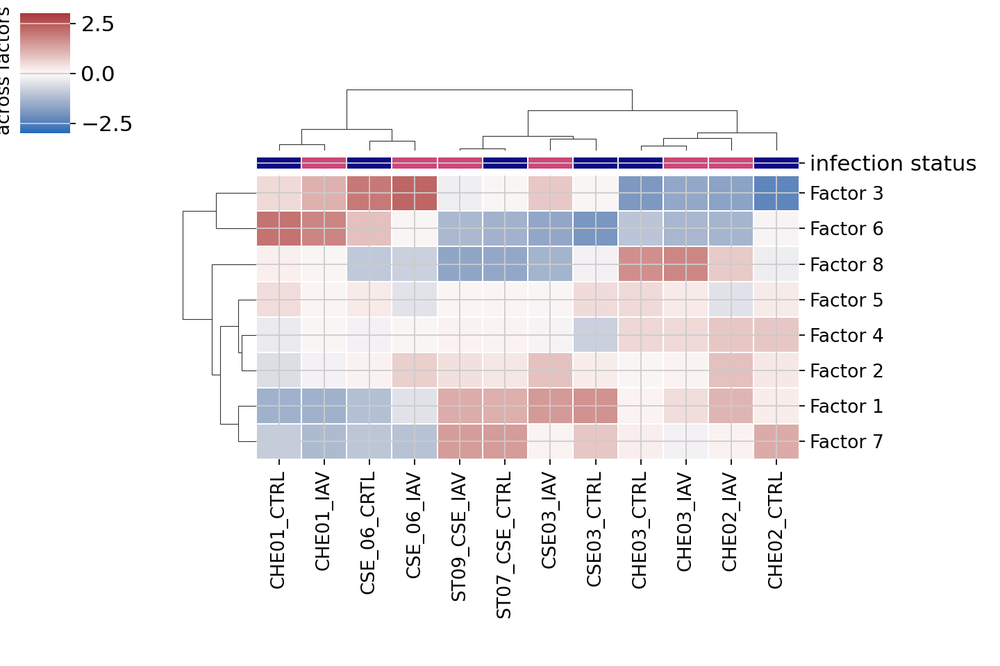

In [58]:
c2c.plotting.loading_clustermap(factors_COPD['Contexts'],
                                use_zscore=True, # Whether standardizing the loadings across factors
                                loading_threshold= 0,
                                col_colors=col_colors, # Change this to color by other properties
                                figsize=(9, 6),
                                dendrogram_ratio=0.3,
                                cbar_fontsize=12,
                                tick_fontsize=12
                                )

In [21]:
context_dict

defaultdict(<function __main__.<lambda>()>,
            {'ST07_CSE_CTRL': 'CTRL',
             'CSE_06_CRTL': 'CTRL',
             'GER14_CRTL': 'CTRL',
             'GnR08_CTRL': 'CTRL',
             'GER12_CTRL': 'CTRL',
             'GER02_CTRL': 'CTRL',
             'ST10_GnR_IAV': 'IAV',
             'GnR_07_IAV': 'IAV',
             'CHE01_IAV': 'IAV',
             'CHE02_IAV': 'IAV',
             'CHE03_IAV': 'IAV',
             'CSE03_IAV': 'IAV',
             'ST09_CSE_IAV': 'IAV',
             'GnR_07_CTRL': 'CTRL',
             'CHE01_CTRL': 'CTRL',
             'CHE02_CTRL': 'CTRL',
             'CHE03_CTRL': 'CTRL',
             'CSE03_CTRL': 'CTRL',
             'ST08_GnR_CTRL': 'CTRL',
             'CSE_06_IAV': 'IAV',
             'GER14_IAV': 'IAV',
             'GnR08_IAV': 'IAV',
             'GER12_IAV': 'IAV',
             'GER02_IAV': 'IAV'})

In [22]:
factors_COPD['Contexts']

,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8
CHE01_CTRL,0.143361,0.230821,0.337788,0.252876,0.333729,0.495828,0.197553,0.304011
CHE01_IAV,0.121002,0.264390,0.414127,0.285390,0.290454,0.493677,0.144504,0.276777
CHE02_CTRL,0.294080,0.298200,0.168638,0.322143,0.295085,0.278205,0.342337,0.269276
CHE02_IAV,0.325529,0.320713,0.238016,0.317396,0.277632,0.249837,0.296614,0.315869
CHE03_CTRL,0.298739,0.286130,0.098188,0.342410,0.339594,0.187726,0.308775,0.449365
CHE03_IAV,0.336838,0.301943,0.132244,0.340852,0.316758,0.162172,0.270287,0.466688
CSE03_CTRL,0.309276,0.283651,0.278286,0.264598,0.288440,0.242279,0.294517,0.275756
CSE03_IAV,0.325232,0.307343,0.304653,0.277661,0.282026,0.234783,0.285444,0.242009
CSE_06_CRTL,0.209735,0.281460,0.386512,0.262806,0.289802,0.323408,0.217210,0.220377
CSE_06_IAV,0.238964,0.317798,0.426258,0.269499,0.240554,0.267284,0.197942,0.217925


(<Figure size 640x960 with 8 Axes>,
 array([[<Axes: title={'center': 'Factor 1'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 2'}, ylabel=' '>],
        [<Axes: title={'center': 'Factor 3'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 4'}, ylabel=' '>],
        [<Axes: title={'center': 'Factor 5'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 6'}, ylabel=' '>],
        [<Axes: title={'center': 'Factor 7'}, ylabel='Context Loadings'>,
         <Axes: title={'center': 'Factor 8'}, ylabel=' '>]], dtype=object))

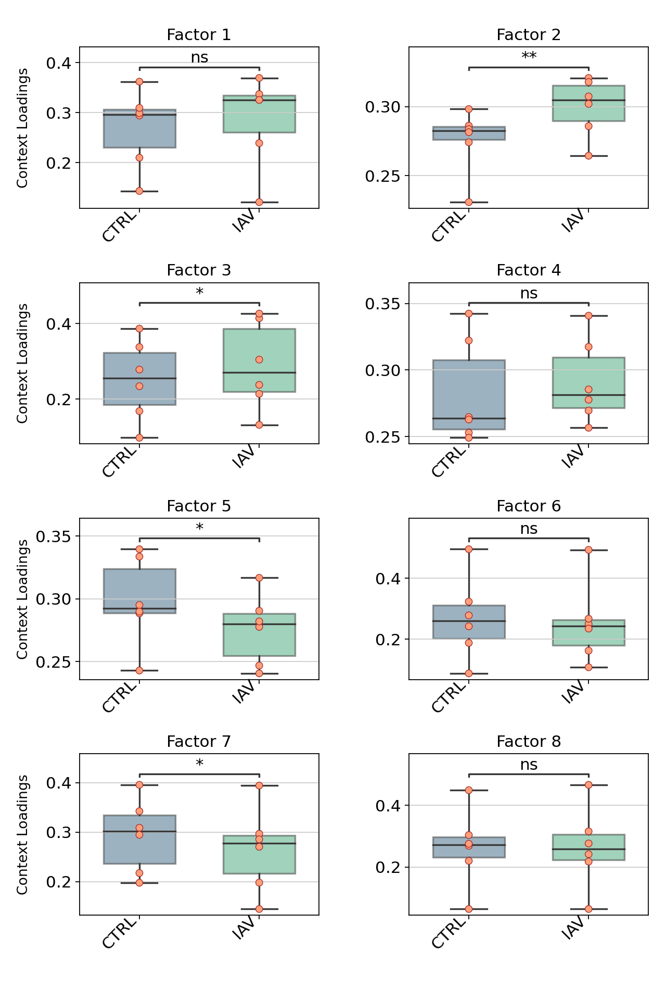

In [23]:
c2c.plotting.factor_plot.context_boxplot(factors_COPD['Contexts'],
                            metadict=context_dict,
                            group_label_rotation= 45,
                            nrows=4,
                            figsize=(8, 12),
                            group_order=['CTRL', 'IAV'],
                            statistical_test='t-test_paired',
                            pval_correction='BH',
                            verbose=False,
                            cmap='viridis',
                            ylabel="Context Loadings",
                            text_format='star'
                            )

(<Figure size 1920x1920 with 9 Axes>,
 array([[<Axes: title={'center': 'Factor 1'}>,
         <Axes: title={'center': 'Factor 2'}>,
         <Axes: title={'center': 'Factor 3'}>],
        [<Axes: title={'center': 'Factor 4'}>,
         <Axes: title={'center': 'Factor 5'}>,
         <Axes: title={'center': 'Factor 6'}>],
        [<Axes: title={'center': 'Factor 7'}>,
         <Axes: title={'center': 'Factor 8'}>, <Axes: >]], dtype=object))

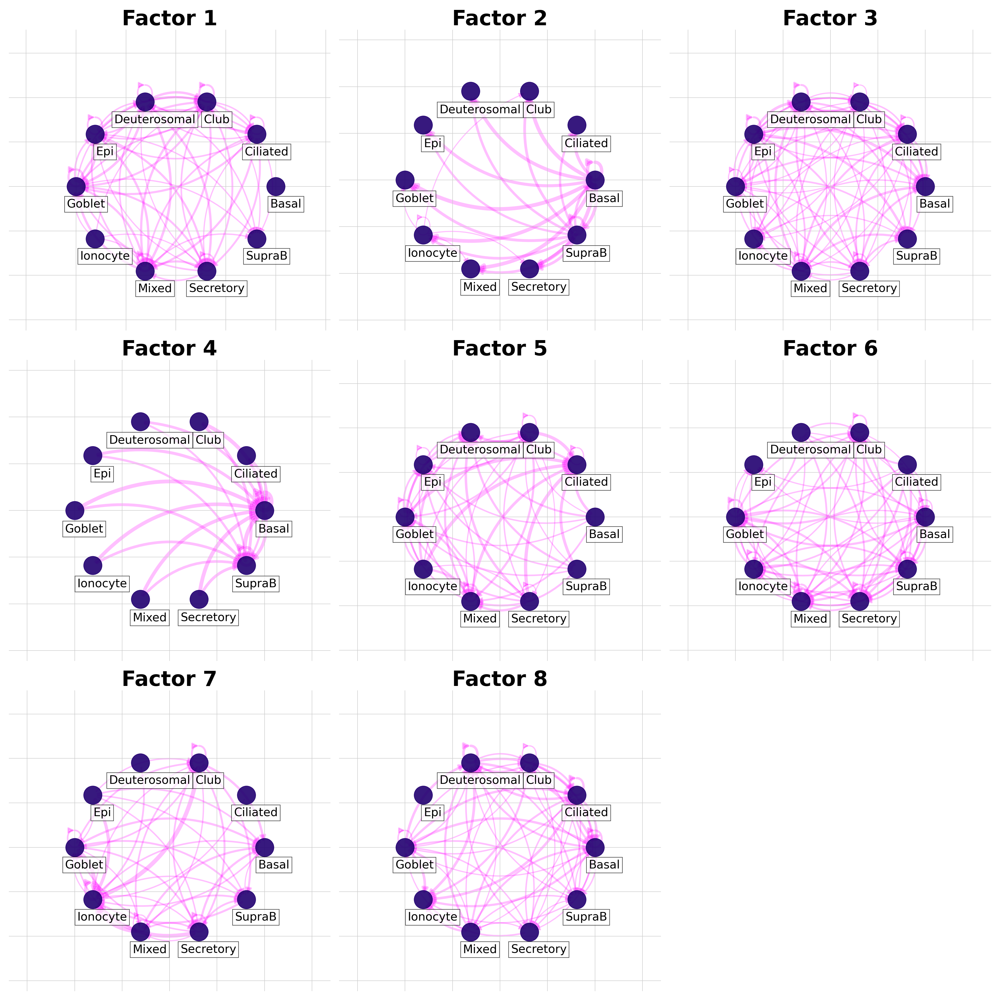

In [24]:
c2c.plotting.ccc_networks_plot(factors_COPD,
                               included_factors=['Factor 1','Factor 2', 'Factor 3','Factor 4','Factor 5', 'Factor 6', 'Factor 7', 'Factor 8'],
                               network_layout='circular',
                               ccc_threshold=0.07, # Only important communication
                               nrows=3,
                               panel_size=(8, 8), # This changes the size of each figure panel.
                              )

GSEA enrichment analysis

In [61]:
lr_loadings_COPD = factors_COPD['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
output_folder = data_dir


In [125]:
# Generate list with ligand-receptors pairs in DB
lr_list = ['^'.join(row) for idx, row in lr_pairs.iterrows()]
# Specify the organism and pathway database to use for building the LR set
organism = "human"
pathwaydb = "Reactome"
# Generate ligand-receptor gene sets
lr_set = c2c.external.generate_lr_geneset(lr_list,
complex_sep='_',
lr_sep='^',
organism=organism,
pathwaydb=pathwaydb,
readable_name=True
)

In [126]:
pvals, scores, gsea_df = c2c.external.run_gsea(loadings=lr_loadings_COPD,
lr_set=lr_set,
output_folder=output_folder+'/GSEA_COPD',
weight=1,
min_size=15,
permutations=999,
processes=6,
random_state=6,
significance_threshold=0.05,
)

/home/camila93/Documents/COPD_influenza/6-cell-cell_comms/4-tensor/.data/GSEA_COPD already exists.


  0%|          | 0/8 [00:00<?, ?it/s]2024-08-12 17:40:17,739 [WARNING] Duplicated values found in preranked stats: 3.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 32 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't']
Glyph IDs:   [0, 1, 2, 3, 36, 37, 38, 39, 40, 42, 44, 47, 49, 50, 51, 53, 54, 55, 68, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 85, 86, 87]
Closed glyph list over 'GSUB': 32 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 

/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first

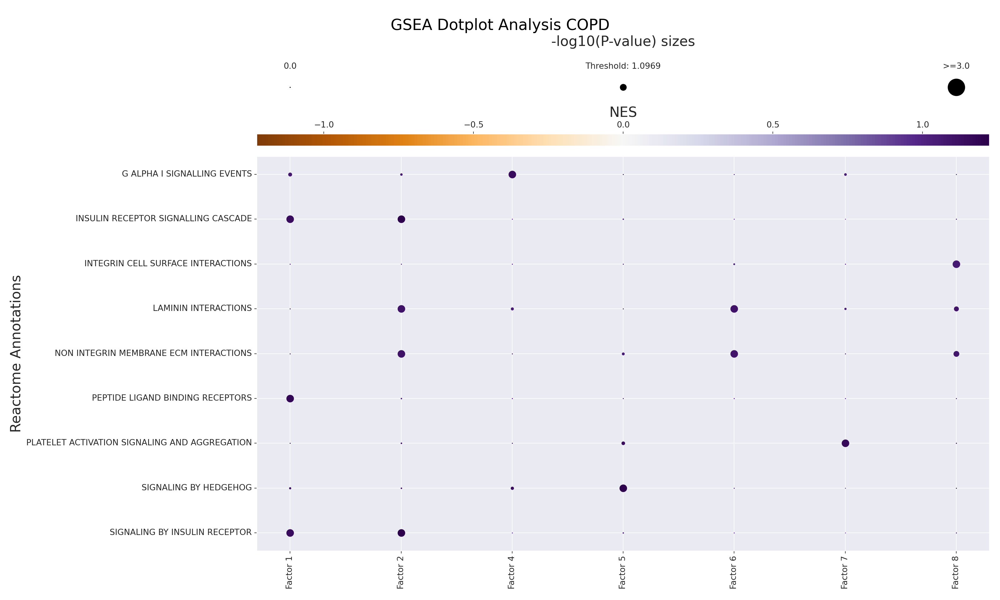

In [129]:
pathway_label = '{} Annotations'.format(pathwaydb)
fig_filename = output_folder + '/GSEA-COPD-Dotplot.pdf'
with sns.axes_style("darkgrid"):
    dotplot = c2c.plotting.pval_plot.generate_dot_plot(pval_df=pvals,
    score_df=scores,
    significance=0.08,
    xlabel='',
    ylabel=pathway_label,
    cbar_title='NES',
    cmap='PuOr',
    figsize=(20, 12),
    label_size=20,
    title_size=20,
    tick_size=12,
    filename=fig_filename
    )

plt.suptitle("GSEA Dotplot Analysis COPD", fontsize=22, y=0.97) 
plt.tight_layout()

Footprint enrichment analysis with PROGENy

In [25]:
lr_loadings_COPD = factors_COPD['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')
# generate ligand-receptor geneset
lr_progeny = li.rs.generate_lr_geneset(lr_pairs, net, lr_sep="^")
# run enrichment analysis
estimate_COPD, pvals_COPD = dc.run_ulm(lr_loadings_COPD.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

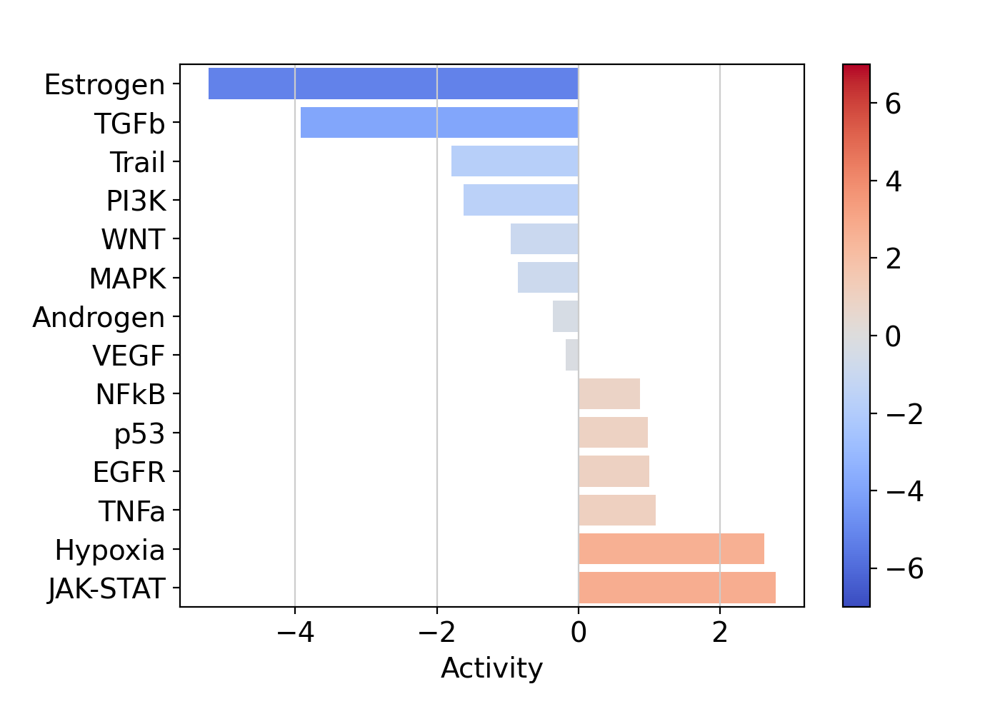

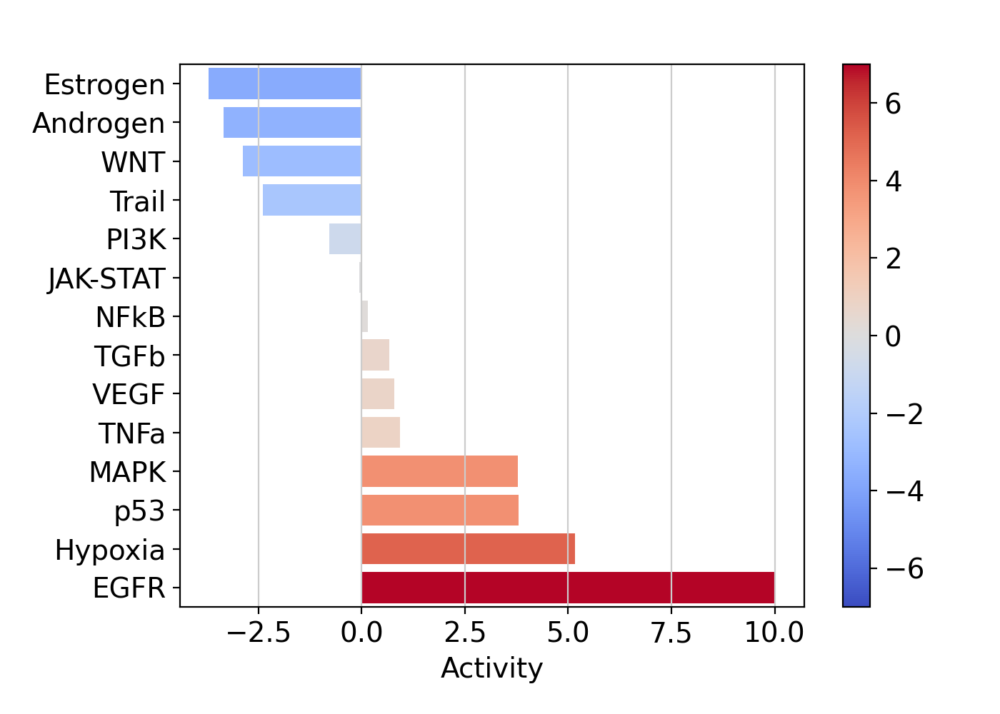

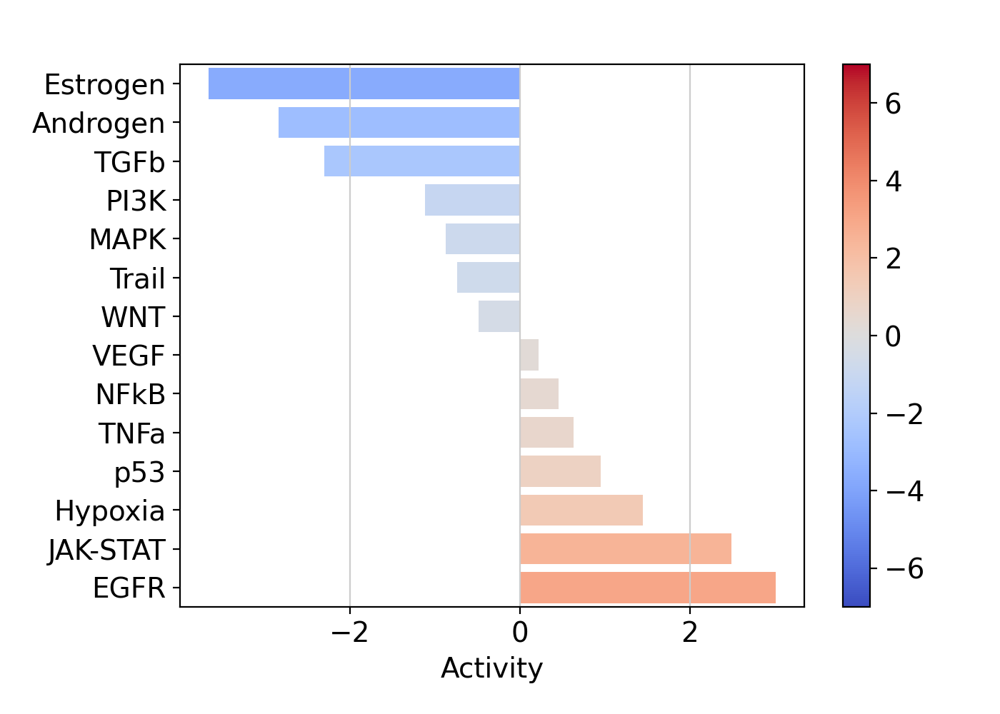

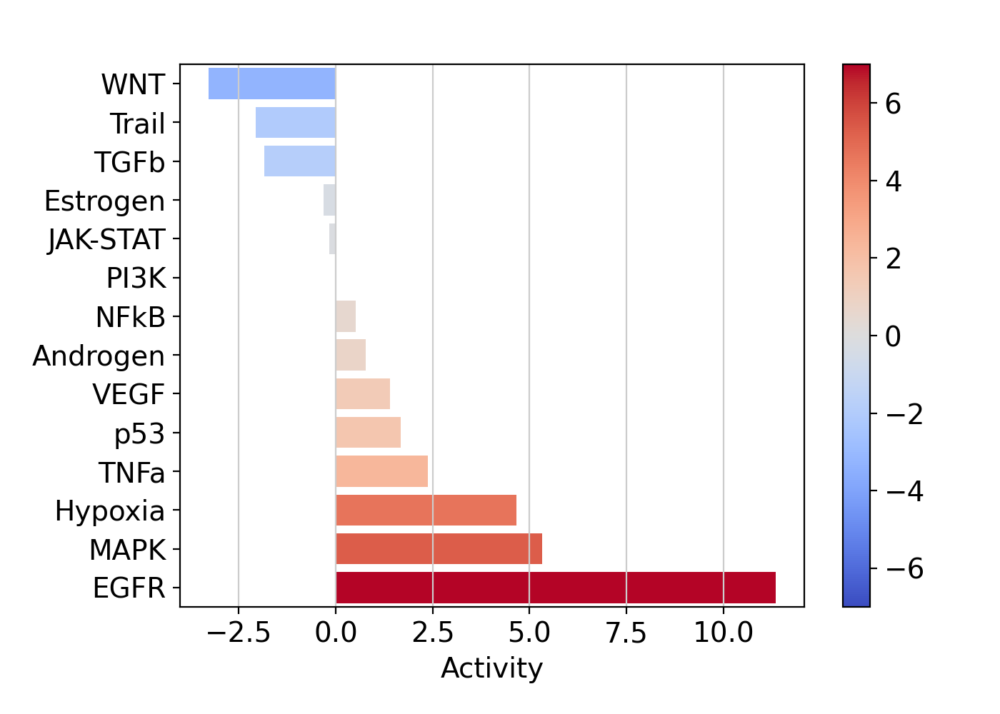

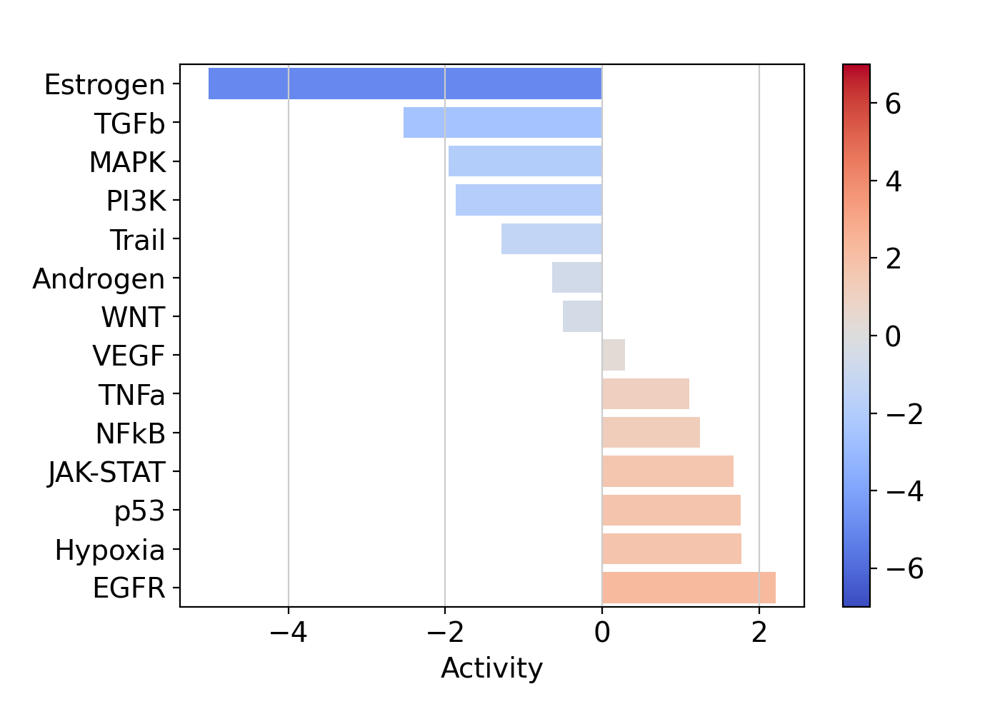

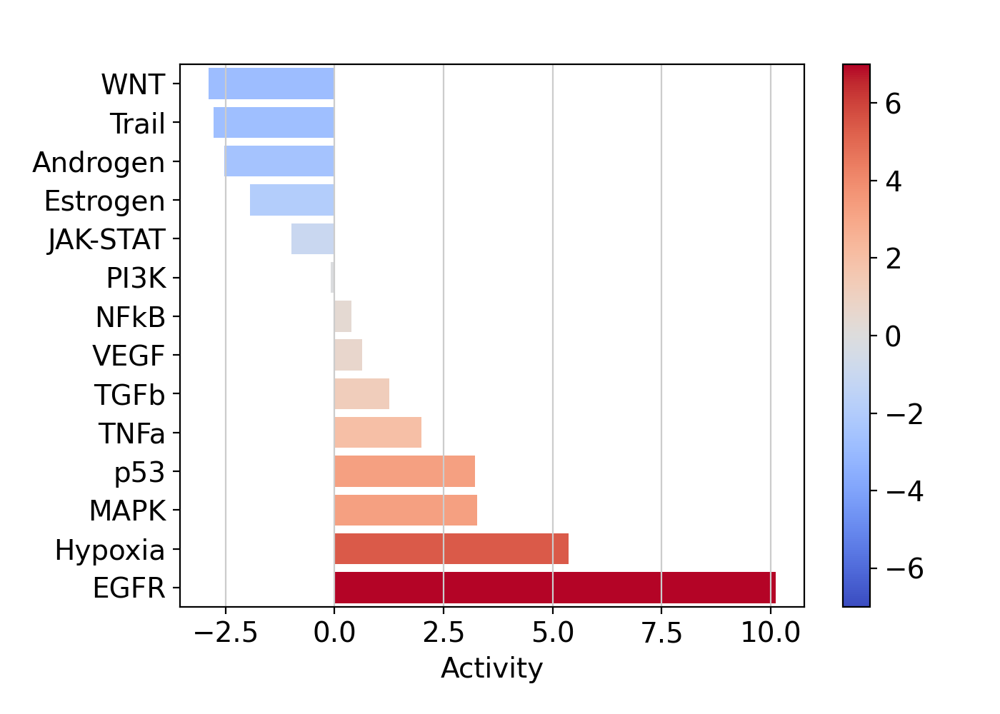

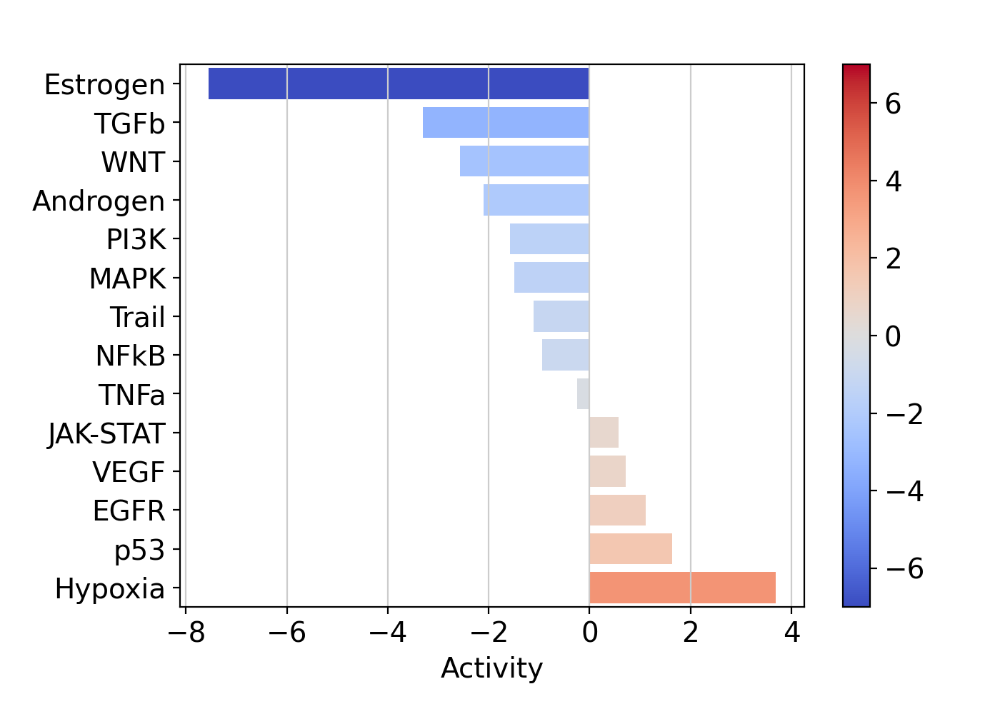

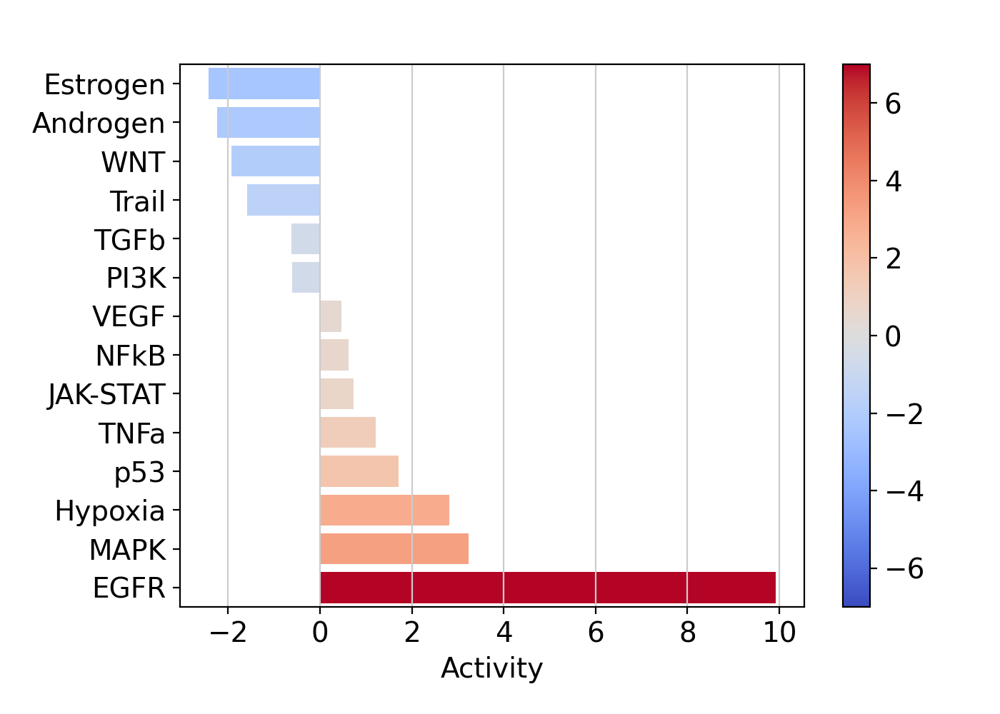

In [26]:
dc.plot_barplot(estimate_COPD, 'Factor 1', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 2', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 3', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 4', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 5', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 6', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 7', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 8', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)

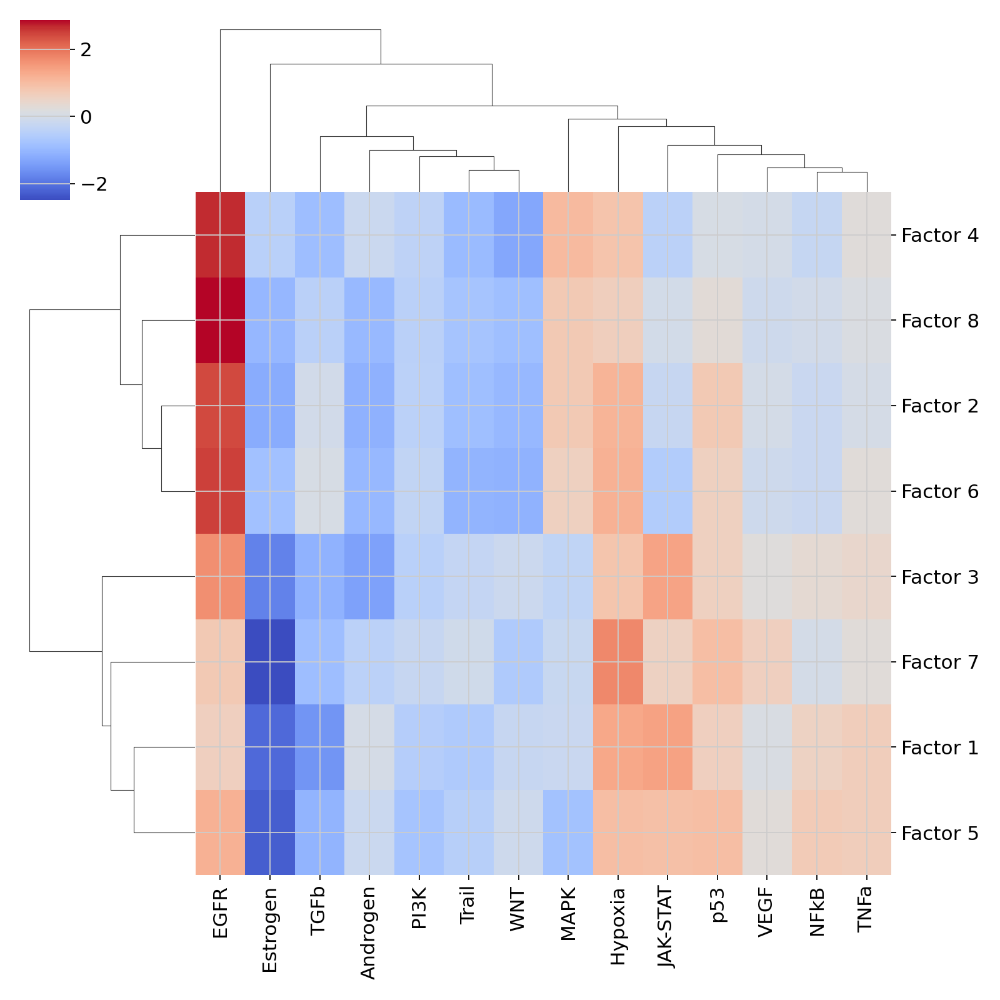

In [27]:
sns.clustermap(estimate_COPD, xticklabels=estimate_healthy.columns, cmap='coolwarm', z_score=4)

/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 1 rows containing missing values.
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_label : Removed 80 rows containing missing values.


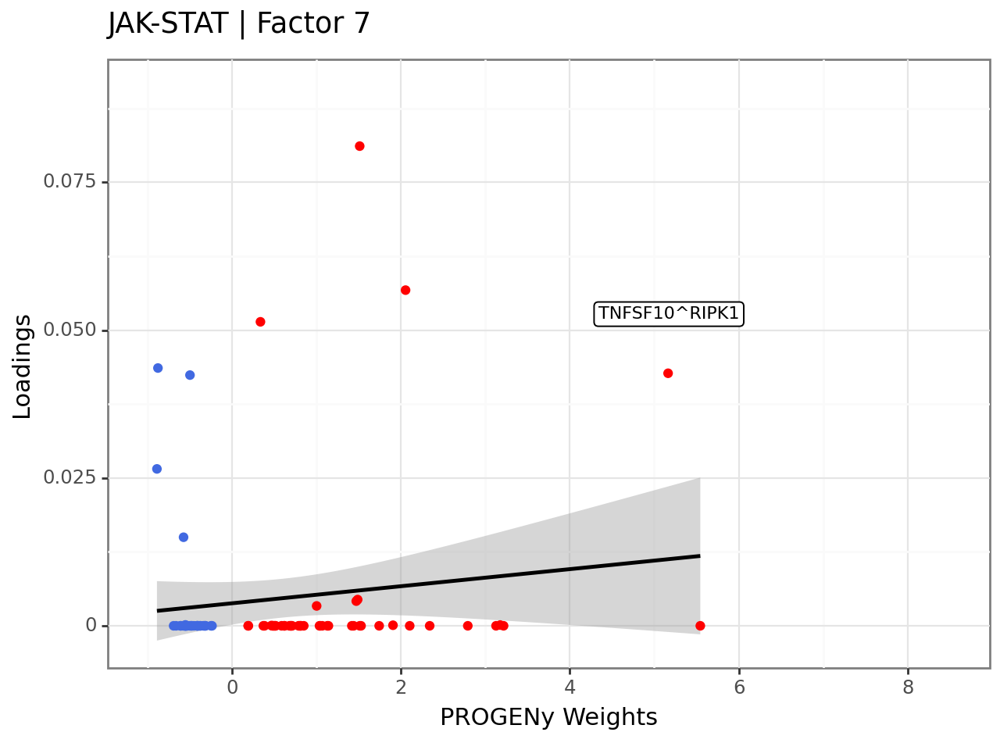

<Figure Size: (640 x 480)>

In [133]:
#select factor of interest
selected_factor = 'Factor 7'
#select pathway of interest
pathway = 'JAK-STAT'
# loadings to long format
lr_loadings_long = lr_loadings_COPD.reset_index().melt(id_vars='index', var_name="Factor", value_name="Loadings").rename(columns={'index':'interaction'})
# join progeny weights and keep only NFkB pathway
lr_loadings_long = lr_loadings_long.merge(lr_progeny, on='interaction').query("source == '{}' and Factor == '{}'".format(pathway, selected_factor))
# add sign to the weights
lr_loadings_long['sign'] = lr_loadings_long['weight'].apply(lambda x: 'positive' if x > 0 else 'negative')
# keep only relevant interactions for labels
lr_loadings_long['relevant_interactions'] = lr_loadings_long.apply(lambda x: x['interaction'] if (x['Loadings'] > 0.00025) and (x['weight'] > 2.5) else None, axis=1)

(p9.ggplot(lr_loadings_long,
           p9.aes(x='weight', y='Loadings')) +
 p9.geom_smooth(method='lm') +
 p9.geom_point(p9.aes(colour='sign')) +
 p9.theme_bw() +
 p9.theme(legend_position='none') +
 p9.labs(title="{} | {}".format(pathway, selected_factor), x="PROGENy Weights", y="Loadings") +
 p9.scale_colour_manual(values=["royalblue", "red"]) +
 p9.geom_label(p9.aes(label='relevant_interactions'), size=8, nudge_y=0.01, nudge_x=0.01) +
 p9.xlim(-1, 8.5)
 )

### Comparison of the most similar Factors in both Groups

In [29]:
def in_and_out_factor_table(dict_df):
    df_in = dict_df['Receiver Cells'].copy()
    df_out = dict_df['Sender Cells'].copy()
    df_in.index = df_in.index + '_in'
    df_out.index = df_out.index + '_out'
    return pd.concat((df_in, df_out))

In [30]:
factors_healthy['Receiver and Sender Cells'] = in_and_out_factor_table(factors_healthy)
factors_COPD['Receiver and Sender Cells'] = in_and_out_factor_table(factors_COPD)

In [31]:
def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    return dot_product / (norm_vec1 * norm_vec2)

factor_metrics = ['Contexts', 'Sender Cells', 'Receiver Cells', 'Receiver and Sender Cells']

metric_sims = {}
for metric in factor_metrics:
    print(f'comparing for metric {metric}')
    factor_metric_values_healthy = factors_healthy[metric]
    factor_metric_values_COPD = factors_COPD[metric]
    factors_healthy_name = factor_metric_values_healthy.columns
    factors_COPD_name = factor_metric_values_COPD.columns
    similarities = pd.DataFrame(index=factor_metric_values_healthy.columns, columns=factor_metric_values_COPD.columns)
    for healthy_factor_name in factors_healthy_name:
        for COPD_factor_name in factors_COPD_name:
            factor_values_healthy = factor_metric_values_healthy[healthy_factor_name]
            factor_values_COPD = factor_metric_values_COPD[COPD_factor_name]
            cosine_sim = cosine_similarity(factor_values_healthy, factor_values_COPD)
            similarities.loc[healthy_factor_name, COPD_factor_name] = cosine_sim
    metric_sims[metric] = similarities
 
    

comparing for metric Contexts
comparing for metric Sender Cells
comparing for metric Receiver Cells
comparing for metric Receiver and Sender Cells


In [32]:
def find_max_values(df):
    max_values = df.max(axis=1)
    max_indices = df.idxmax(axis=1)
    result = pd.DataFrame({'Max Value': max_values, 'Row Index': max_indices})
    return result

In [33]:
metric = 'Contexts'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.993249,Factor 5
Factor 2,0.991257,Factor 2
Factor 3,0.993517,Factor 2
Factor 4,0.986862,Factor 2
Factor 5,0.987531,Factor 2
Factor 6,0.974365,Factor 4
Factor 7,0.969488,Factor 8


In [34]:
metric = 'Sender Cells'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.986524,Factor 3
Factor 2,0.994617,Factor 7
Factor 3,0.988483,Factor 2
Factor 4,0.986683,Factor 5
Factor 5,0.889113,Factor 1
Factor 6,0.988726,Factor 4
Factor 7,0.922994,Factor 6


In [35]:
metric = 'Receiver Cells'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.986044,Factor 1
Factor 2,0.905128,Factor 7
Factor 3,0.994492,Factor 2
Factor 4,0.983794,Factor 5
Factor 5,0.997489,Factor 2
Factor 6,0.939278,Factor 4
Factor 7,0.988748,Factor 2


In [36]:
metric = 'Receiver and Sender Cells'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.972863,Factor 1
Factor 2,0.949872,Factor 7
Factor 3,0.991488,Factor 2
Factor 4,0.985239,Factor 5
Factor 5,0.922684,Factor 1
Factor 6,0.964002,Factor 4
Factor 7,0.932069,Factor 8


Factor 6 from healthy and Factor 4 from COPD patients appears very similar

### Boxplots

Factor 1 Factor 1
Factor 2 Factor 7
Factor 3 Factor 2
Factor 4 Factor 5
Factor 5 Factor 1
Factor 6 Factor 4
Factor 7 Factor 8


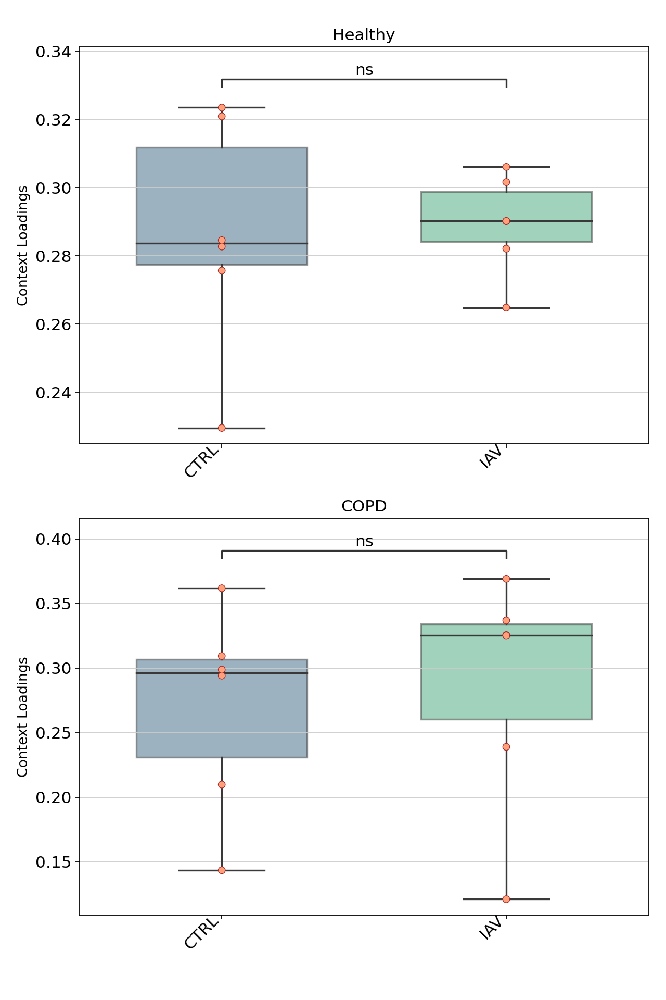

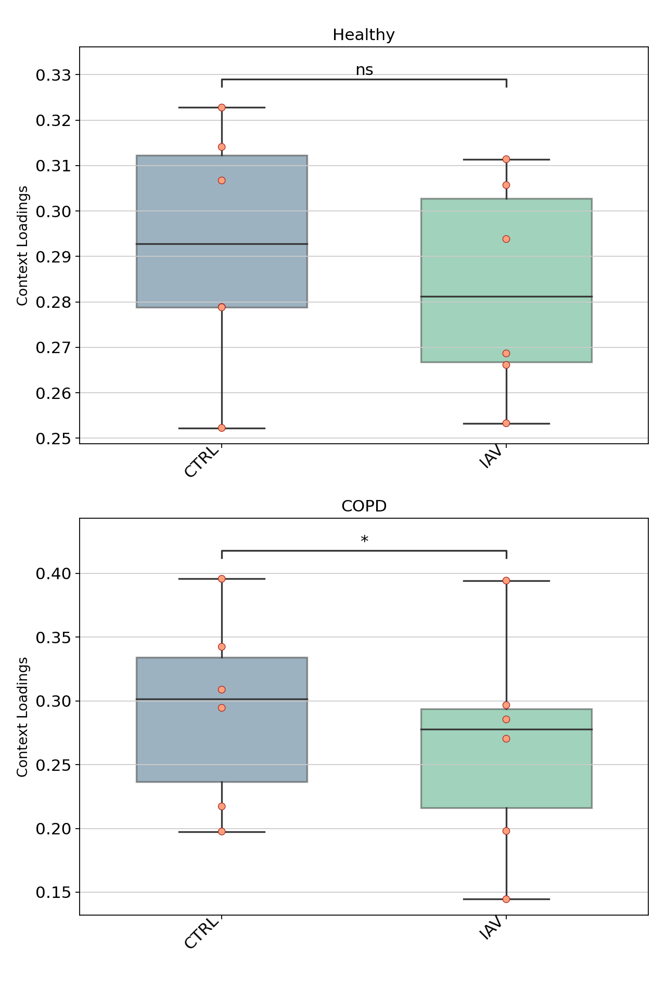

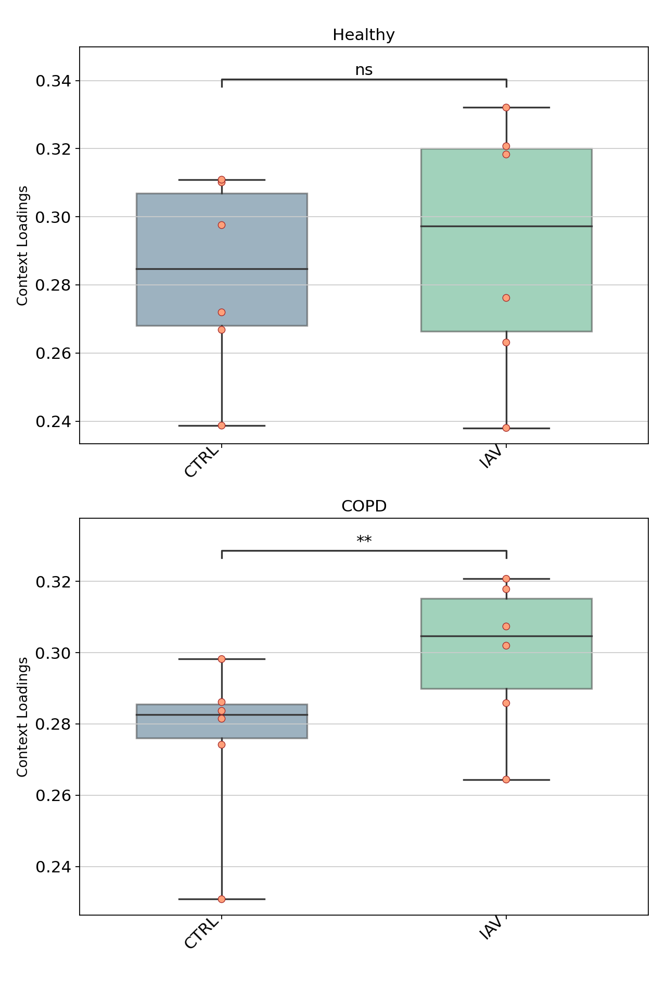

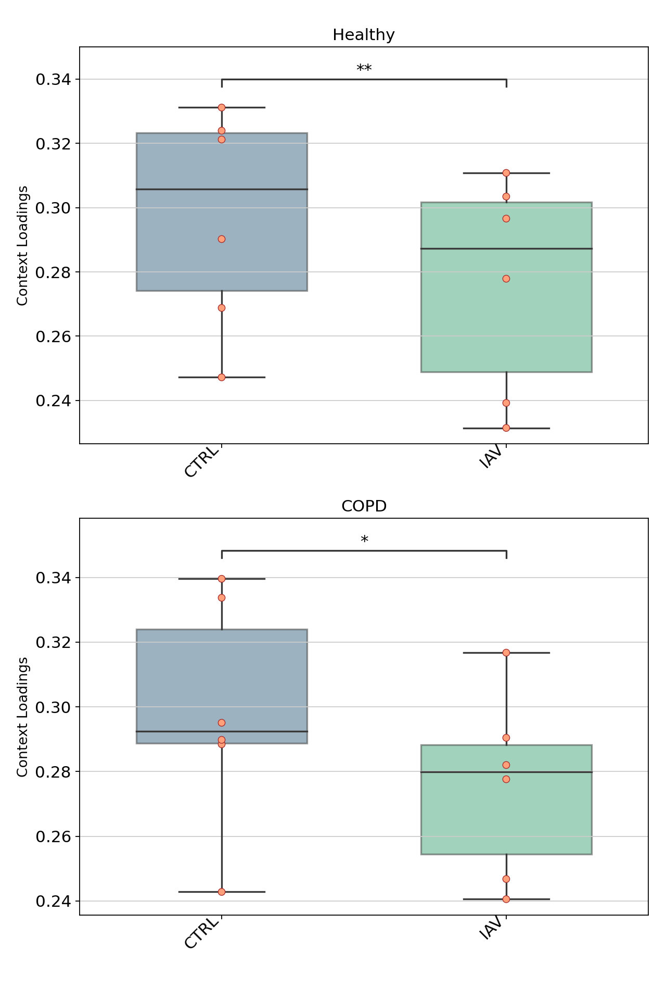

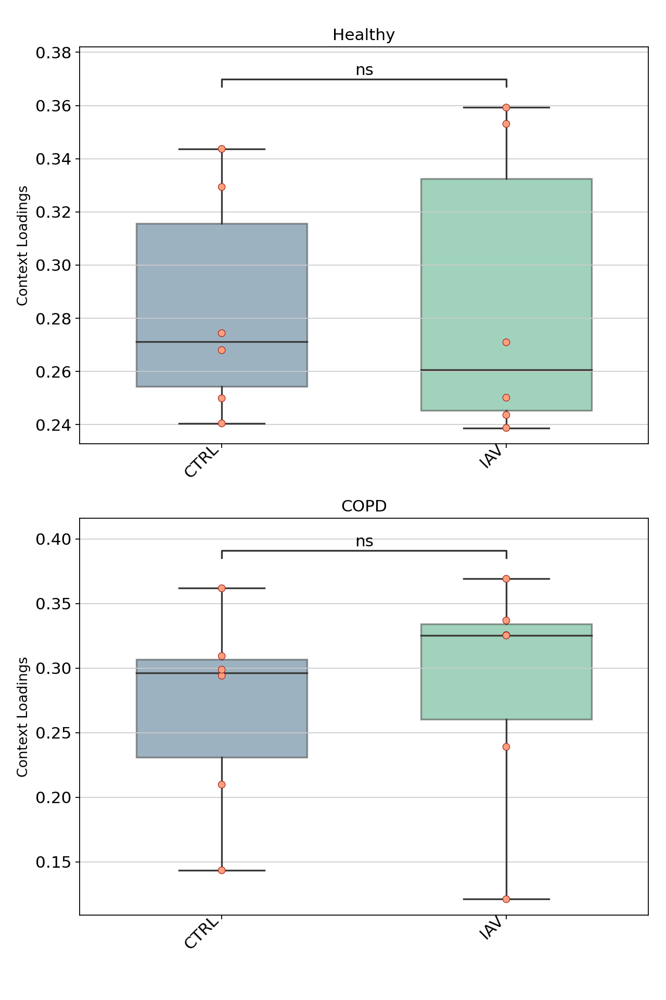

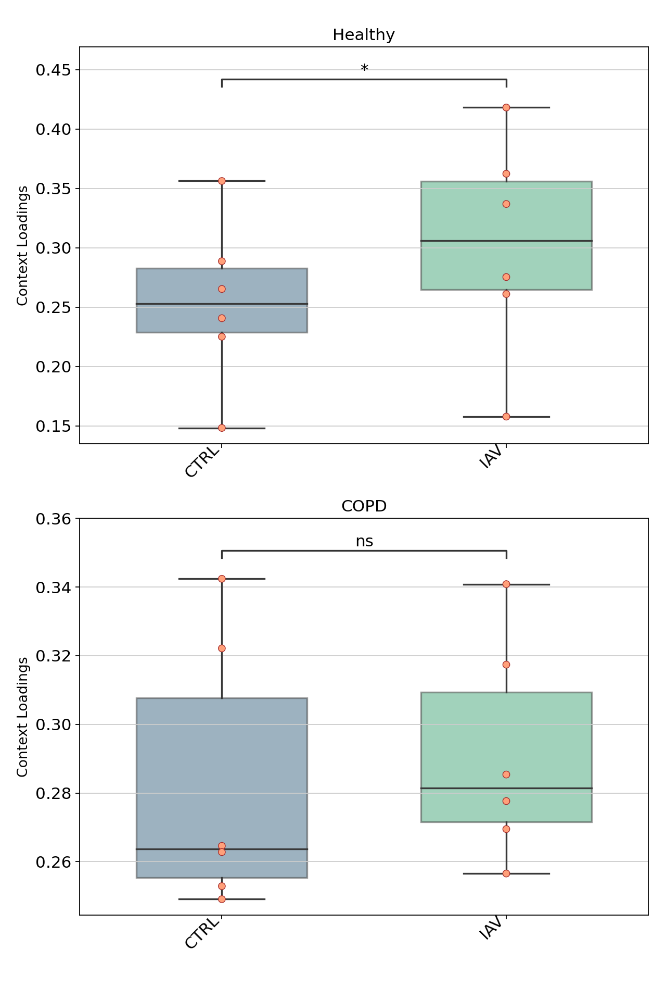

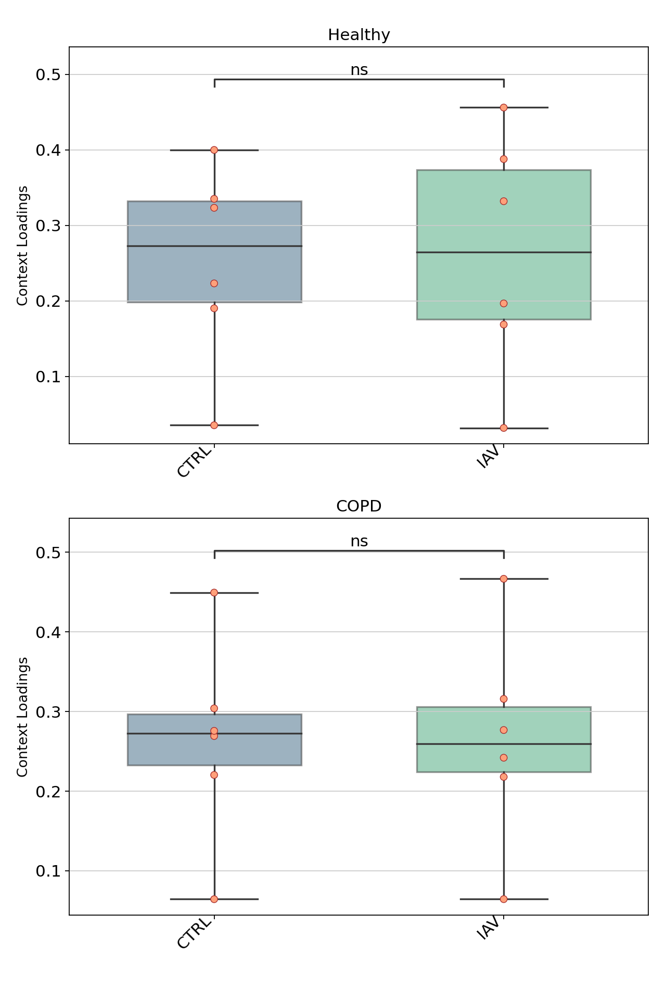

In [37]:
for row in result.iterrows():
    healthy_factor_values = factors_healthy['Contexts'][row[1].name]
    COPD_factor_values = factors_COPD['Contexts'][row[1]['Row Index']]
    index = list(factors_healthy['Contexts'].index ) + list(factors_COPD['Contexts'].index)
    concatenated_df = pd.DataFrame(index=index)
    concatenated_df['Healthy'] = healthy_factor_values
    print(row[1].name, row[1]['Row Index'])
    concatenated_df['COPD'] = COPD_factor_values
    c2c.plotting.factor_plot.context_boxplot(concatenated_df,
                            metadict=context_dict,
                            group_label_rotation= 45,
                            nrows=4,
                            figsize=(8, 12),
                            group_order=['CTRL', 'IAV'],
                            statistical_test='t-test_paired',
                            pval_correction='BH',
                            verbose=False,
                            cmap='viridis',
                            ylabel="Context Loadings",
                            text_format='star',
                            )

### Circos Plots

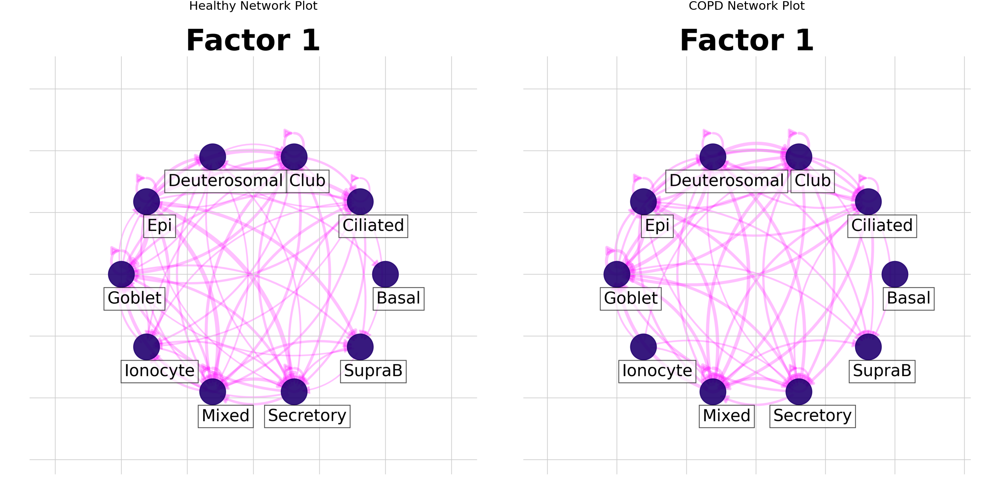

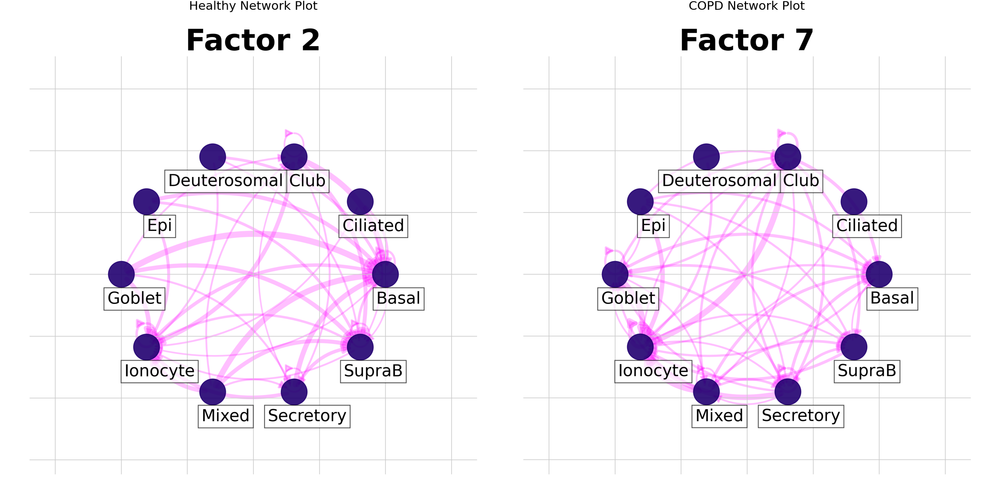

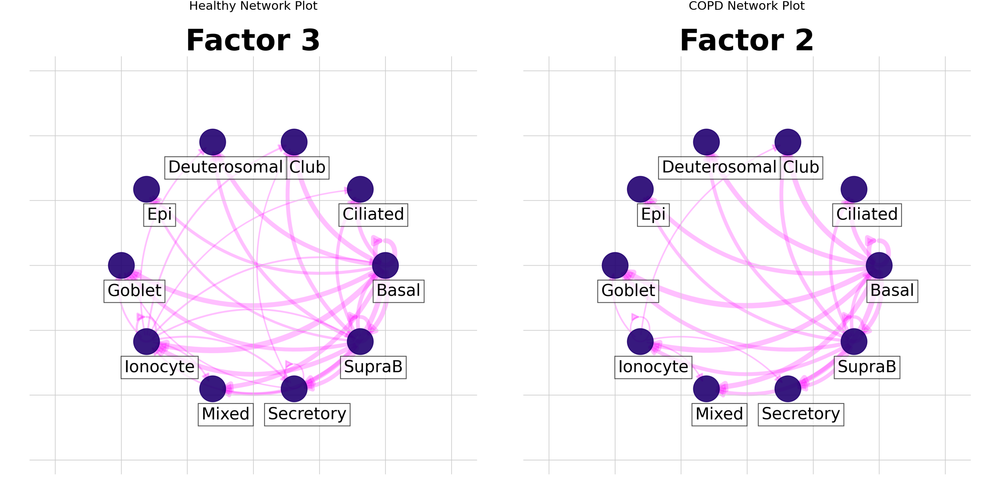

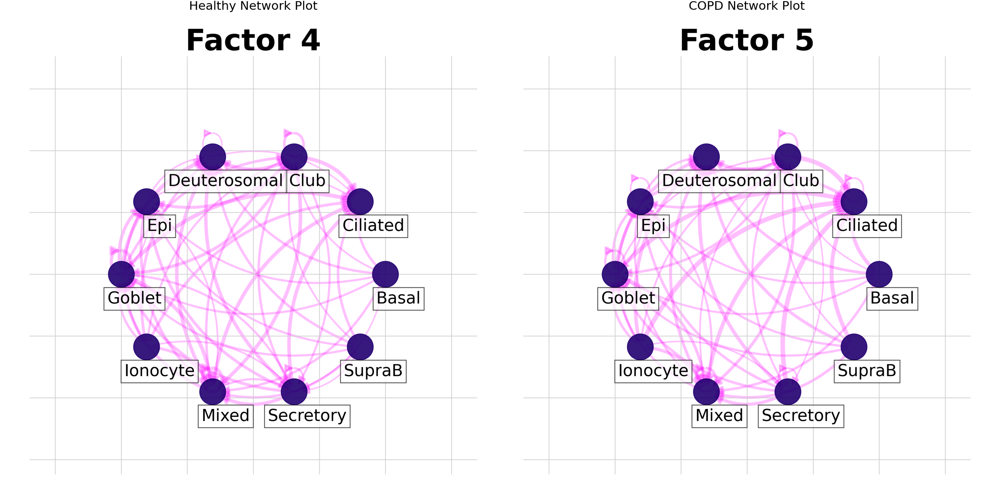

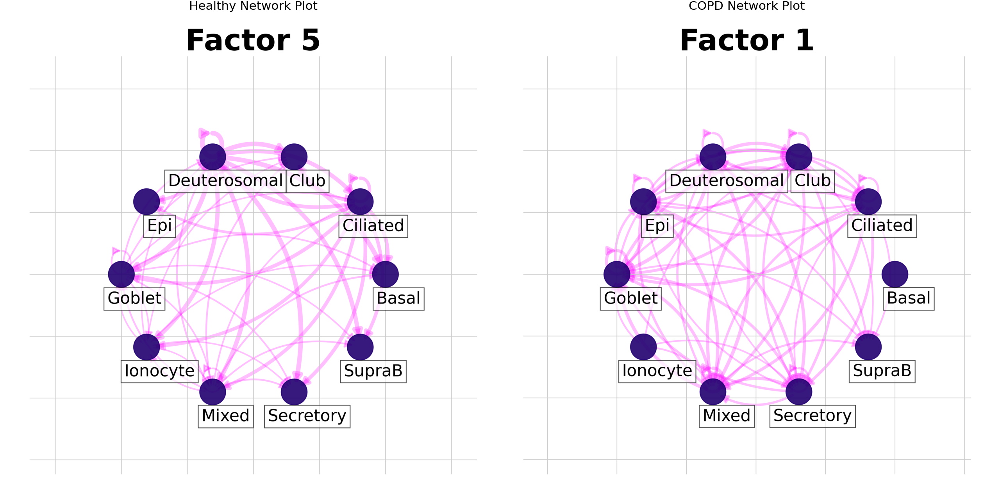

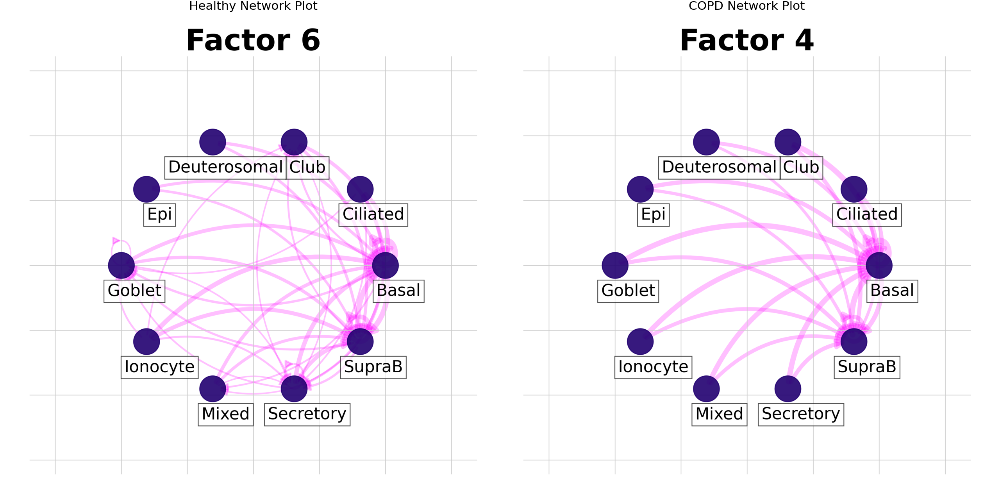

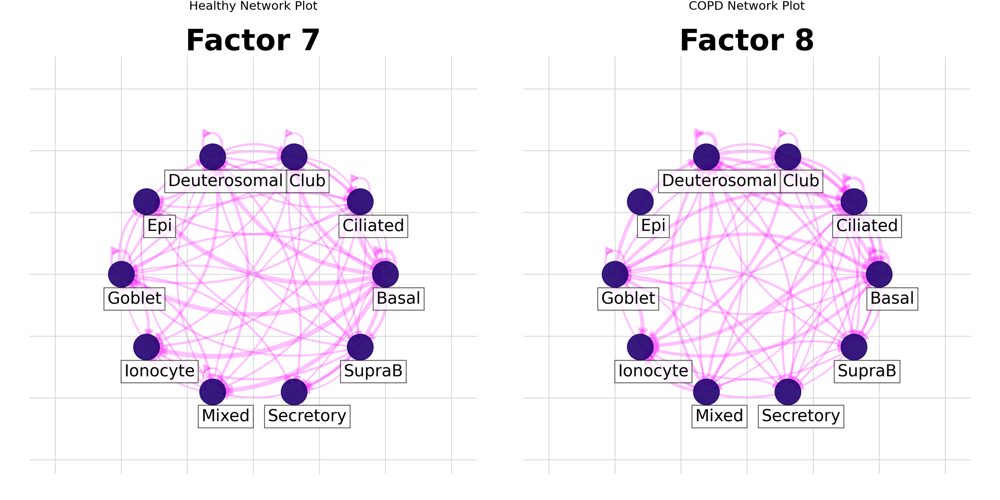

In [38]:


for row in result.iterrows():
    healthy_factor_values = factors_healthy['Contexts'][row[1].name]
    COPD_factor_values = factors_COPD['Contexts'][row[1]['Row Index']]
    # Save the first plot to a buffer
    buf1 = save_plot_to_buffer(
        c2c.plotting.ccc_networks_plot,
        factors_healthy,
        included_factors=[row[1].name],
        network_layout='circular',
        ccc_threshold=0.07,
        nrows=3,
        panel_size=(8, 8)
    )

    # Save the second plot to a buffer
    buf2 = save_plot_to_buffer(
        c2c.plotting.ccc_networks_plot,
        factors_COPD,
        included_factors=[row[1]['Row Index']],
        network_layout='circular',
        ccc_threshold=0.07,
        nrows=3,
        panel_size=(8, 8)
    )

    # Load the images from the buffers
    img1 = PIL.Image.open(buf1)
    img2 = PIL.Image.open(buf2)

    # Create a new figure to display the images side by side
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Display each image in a subplot
    axs[0].imshow(img1)
    axs[0].set_title('Healthy Network Plot')
    axs[0].axis('off')  # Hide axes

    axs[1].imshow(img2)
    axs[1].set_title('COPD Network Plot')
    axs[1].axis('off')  # Hide axes

    # Adjust layout and display the combined figure
    plt.tight_layout()
    plt.show()

### Loadings

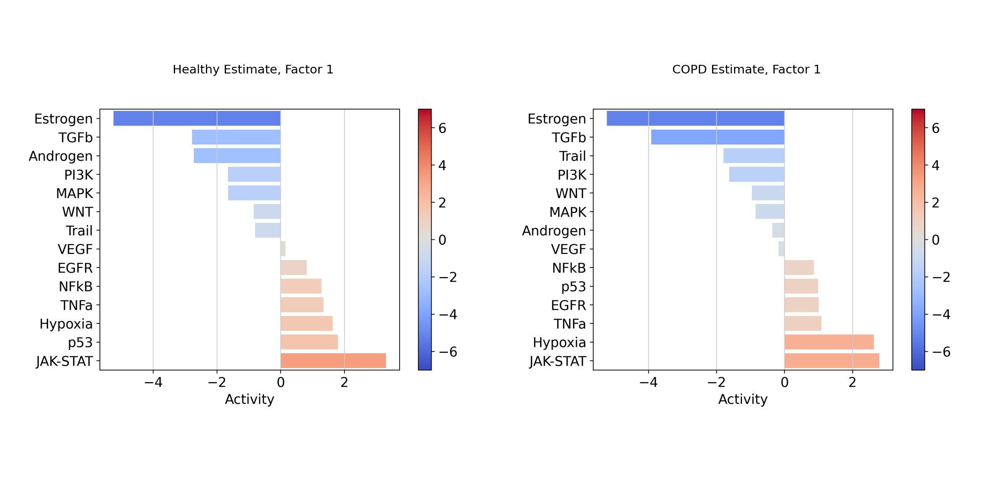

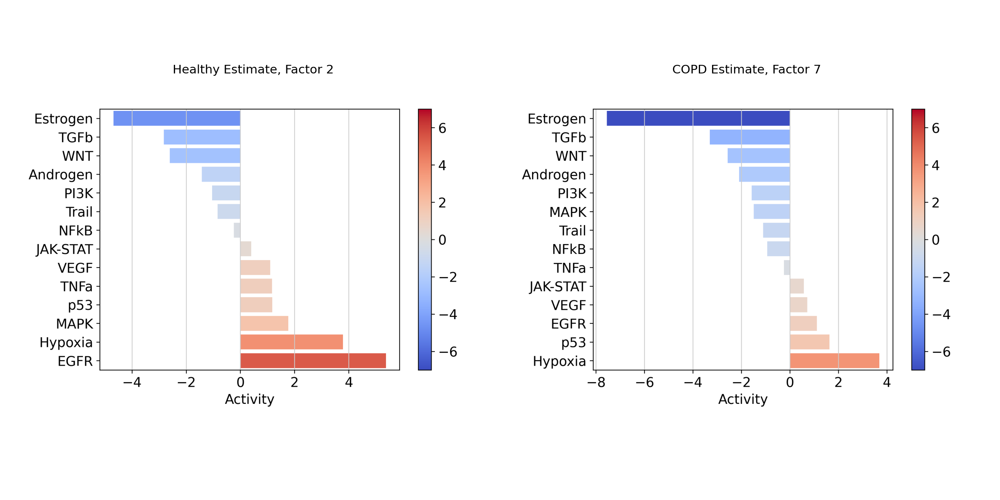

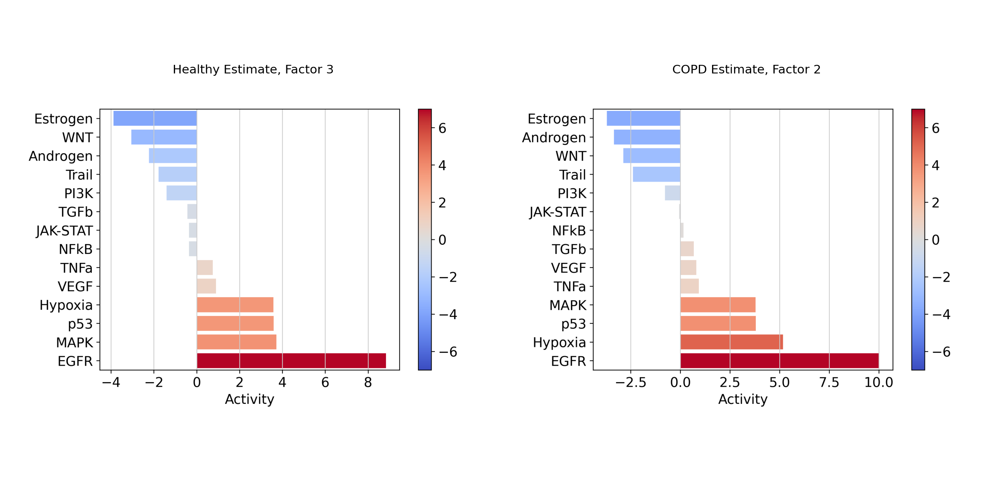

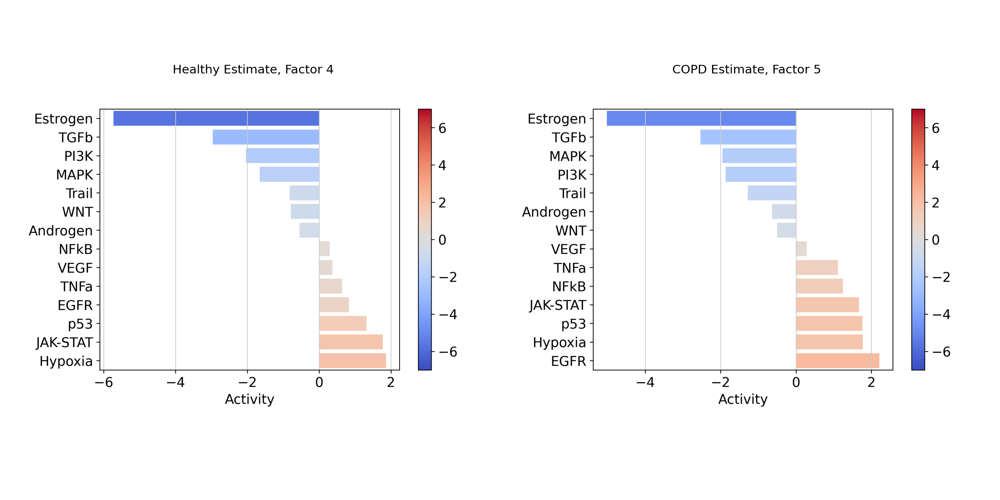

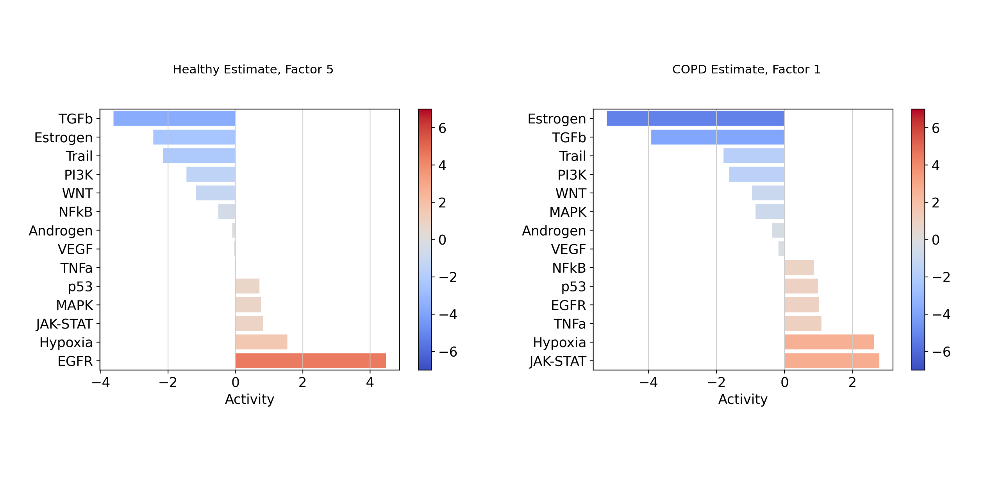

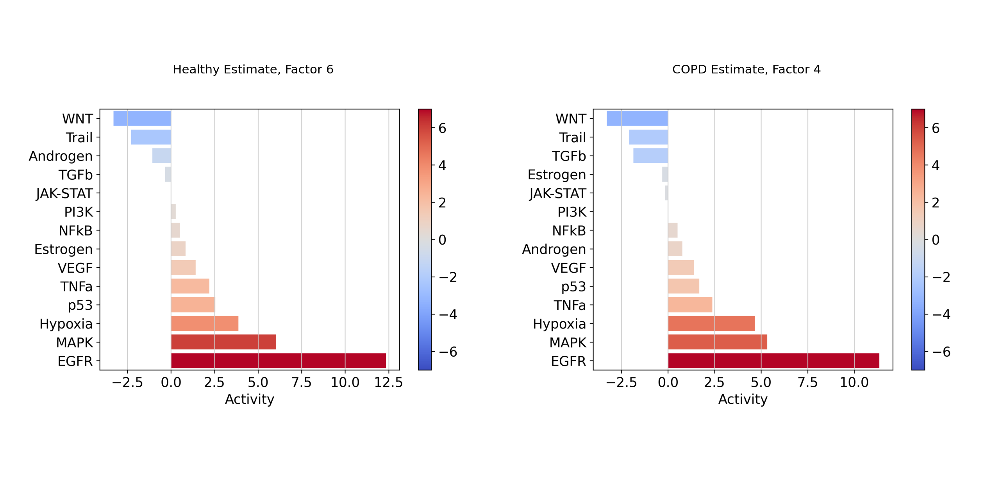

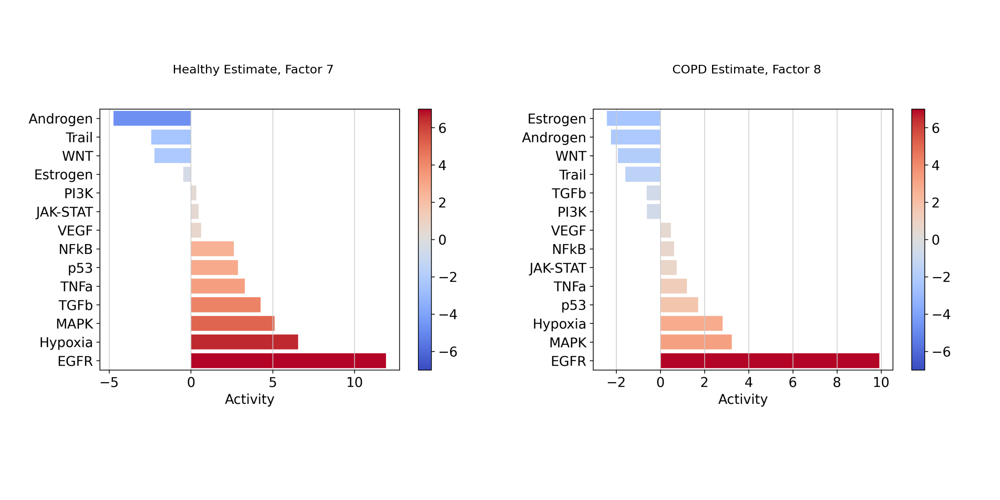

In [39]:

# Function to save a plot to a BytesIO object
def save_plot_to_buffer(plot_func, *args, **kwargs):
    buf = BytesIO()
    plot_func(*args, **kwargs)
    plt.savefig(buf, format='png')
    buf.seek(0)
    plt.close()
    return buf

for row in result.iterrows():
    # Save the first plot to a buffer
    buf1 = save_plot_to_buffer(
        dc.plot_barplot,
        estimate_healthy,
        row[1].name,
        vertical=True,
        cmap='coolwarm',
        vmin=-7,
        vmax=7
    )

    # Save the second plot to a buffer
    buf2 = save_plot_to_buffer(
        dc.plot_barplot,
        estimate_COPD,
        row[1]['Row Index'],
        vertical=True,
        cmap='coolwarm',
        vmin=-7,
        vmax=7
    )

    # Load the images from the buffers
    img1 = PIL.Image.open(buf1)
    img2 = PIL.Image.open(buf2)

    # Create a new figure to display the images side by side
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Display each image in a subplot
    axs[0].imshow(img1)
    axs[0].set_title(f'Healthy Estimate, {row[1].name}')
    axs[0].axis('off')  # Hide axes

    axs[1].imshow(img2)
    axs[1].set_title(f'COPD Estimate, {row[1]["Row Index"]}')
    axs[1].axis('off')  # Hide axes

    # Adjust layout and display the combined figure
    plt.tight_layout()
    plt.show()

/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 15 rows containing missing values.
/home/camila93/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_label : Removed 70 rows containing missing values.


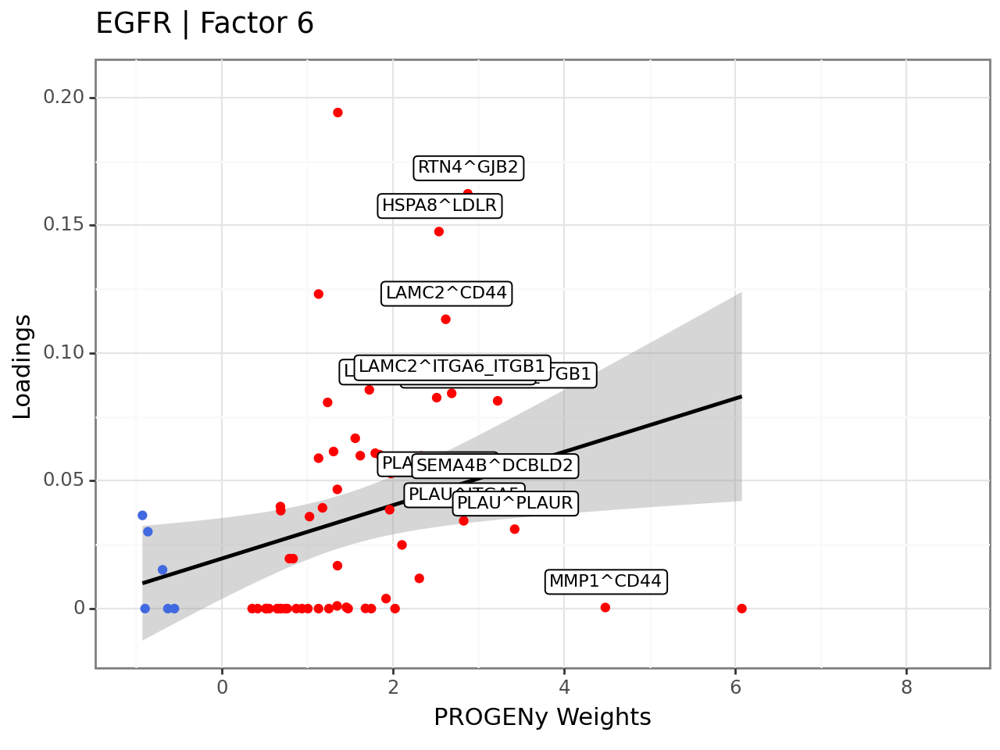

<Figure Size: (640 x 480)>

In [52]:
#select factor of interest
selected_factor = 'Factor 6'
#select pathway of interest
pathway = 'EGFR'
# loadings to long format
lr_loadings_long = lr_loadings_healthy.reset_index().melt(id_vars='index', var_name="Factor", value_name="Loadings").rename(columns={'index':'interaction'})
# join progeny weights and keep only NFkB pathway
lr_loadings_long = lr_loadings_long.merge(lr_progeny, on='interaction').query("source == '{}' and Factor == '{}'".format(pathway, selected_factor))
# add sign to the weights
lr_loadings_long['sign'] = lr_loadings_long['weight'].apply(lambda x: 'positive' if x > 0 else 'negative')
# keep only relevant interactions for labels
lr_loadings_long['relevant_interactions'] = lr_loadings_long.apply(lambda x: x['interaction'] if (x['Loadings'] > 0.00025) and (x['weight'] > 2.5) else None, axis=1)

(p9.ggplot(lr_loadings_long,
           p9.aes(x='weight', y='Loadings')) +
 p9.geom_smooth(method='lm') +
 p9.geom_point(p9.aes(colour='sign')) +
 p9.theme_bw() +
 p9.theme(legend_position='none') +
 p9.labs(title="{} | {}".format(pathway, selected_factor), x="PROGENy Weights", y="Loadings") +
 p9.scale_colour_manual(values=["royalblue", "red"]) +
 p9.geom_label(p9.aes(label='relevant_interactions'), size=8, nudge_y=0.01, nudge_x=0.01) +
 p9.xlim(-1, 8.5)
 )